<a href="https://colab.research.google.com/github/mgboebinger/FaSTEM/blob/main/High_Temporal_MoS2_Decoding_240815.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook goes through the process of taking the simulated training datasets of randomly defective MoS2 to making a DCNN. These results are then post-processed to allowing for the tracking of atomic species in lower resolution rapidly acquired image datasets.

- Data: Matt Boebinger and Ray Unocic
- Workflow: Ayana Ghosh and Matt Boebinger
- ELIT: published by Ayana Ghosh
- AtomAI: published by Maxim Ziatdinov and Sergei Kalinin
- Stemtools: published by Debangshu Mukherjee

# Initilize and Mount Drive

In [1]:
%matplotlib inline

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!pip install stemtool==0.534
!pip install atomai

In [4]:
import matplotlib.pyplot as plt
from ase.io import read
from ase.build import mx2

from ase.io import write

import numpy as np
import pandas as pd
import os, sys
import matplotlib.pyplot as plt
import atomai as aoi
import stemtool as st
import torch
import random
import skimage
import math
import seaborn as sns
import scipy.spatial as spatial
import imageio
import skimage.feature as skfeat

import matplotlib.gridspec as gridspec
from copy import deepcopy as dc

from skimage import data, feature, exposure
if int(skimage.__version__.split('.')[1]) < 14:
    from warnings import warn
    warn('Your skimage version is: {} but the recommended version is 0.14.0.'
         'Some features may not work if you do not have the latest version'.format(skimage.__version__))
from skimage import io
from skimage import filters
from skimage.morphology import disk
from skimage.feature import blob_log
from skimage import data
from skimage import measure
from skimage.filters import threshold_mean, threshold_isodata, threshold_minimum, threshold_otsu, threshold_triangle, threshold_li
from skimage.util import random_noise
from skimage import exposure
from skimage import transform
from skimage.transform import rotate
from skimage import color, data, restoration
from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)
from skimage import data, img_as_float

from scipy.spatial import cKDTree
from scipy.signal import convolve2d as conv2

from atomai.utils import create_lattice_mask, extract_patches_
from atomai.transforms import datatransform

from PIL import Image
np.set_printoptions(suppress=True)
import warnings
warnings.filterwarnings('ignore')

In [5]:
def normalize_image(img_2D_array):
  min_val = np.min(img_2D_array)
  max_val = np.max(img_2D_array)
  img_2D_array_norm = (img_2D_array - min_val)/(max_val - min_val)
  img_2D_array_norm = img_2D_array_norm
  return img_2D_array_norm

# Training Data set masks

In [6]:
# Download the simulated HAADF image of defective MoS2
!gdown https://drive.google.com/uc?id=1-2pk2IFH5QDIb_ab25hRf0BHOMs4AoN_

# Download the atom position lists from atom finding for each versions - corrected
!gdown https://drive.google.com/uc?id=1GsQX7WuyCdscRA3W5EI1QYAxXSJbX7Lz
!gdown https://drive.google.com/uc?id=1-0m7WpPWnow0LoKJrezJEYZ7FYyBlef-
!gdown https://drive.google.com/uc?id=1-0cYyzckaBYyz_4pvA8jb3036gDVO6Gz

Downloading...
From: https://drive.google.com/uc?id=1-2pk2IFH5QDIb_ab25hRf0BHOMs4AoN_
To: /content/MoS2_sim_rand1S_v1_haadf.npy
100% 24.4M/24.4M [00:00<00:00, 41.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1GsQX7WuyCdscRA3W5EI1QYAxXSJbX7Lz
To: /content/Mo_mask_atm_pos_v1.npy
100% 13.7k/13.7k [00:00<00:00, 52.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0m7WpPWnow0LoKJrezJEYZ7FYyBlef-
To: /content/S2_mask_atm_pos_v1.npy
100% 11.2k/11.2k [00:00<00:00, 44.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0cYyzckaBYyz_4pvA8jb3036gDVO6Gz
To: /content/S1_mask_atm_pos_v1.npy
100% 2.46k/2.46k [00:00<00:00, 13.7MB/s]


In [7]:
# Load appropriate versions list made from above section

image_sim = np.load('MoS2_sim_rand1S_v1_haadf.npy')
Mo_mask_atm_pos_npy = np.load('Mo_mask_atm_pos_v1.npy')
S2_mask_atm_pos_npy = np.load('S2_mask_atm_pos_v1.npy')
S1_mask_atm_pos_npy = np.load('S1_mask_atm_pos_v1.npy')

In [8]:
lattice_im = image_sim
xy_atoms_Mo = Mo_mask_atm_pos_npy
xy_atoms_S2 = S2_mask_atm_pos_npy
xy_atoms_S1 = S1_mask_atm_pos_npy

(1784, 1711) (848, 2) (694, 2) (146, 2)


In [9]:
s = 25
r = 17

lattice_mask_Mo = aoi.utils.create_lattice_mask(lattice_im, xy_atoms_Mo, scale=s, rmask=r)
lattice_mask_S2 = aoi.utils.create_lattice_mask(lattice_im, xy_atoms_S2, scale=s, rmask=r)
lattice_mask_S1 = aoi.utils.create_lattice_mask(lattice_im, xy_atoms_S1, scale=s, rmask=r)

In [10]:
print('data type: {}, Min: {}, max: {}'.format(lattice_mask_Mo.shape, lattice_mask_Mo.min(), lattice_mask_Mo.max()))
print('data type: {}, Min: {}, max: {}'.format(lattice_mask_S2.shape, lattice_mask_S2.min(), lattice_mask_S2.max()))
print('data type: {}, Min: {}, max: {}'.format(lattice_mask_S1.shape, lattice_mask_S1.min(), lattice_mask_S1.max()))

data type: (1784, 1711), Min: 0.0, max: 1.0
data type: (1784, 1711), Min: 0.0, max: 1.0
data type: (1784, 1711), Min: 0.0, max: 1.0


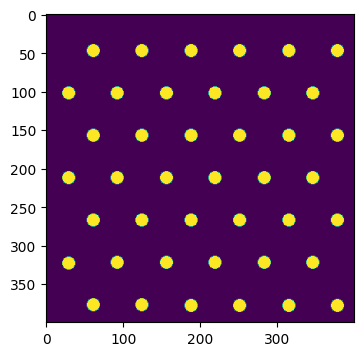

In [11]:
thresh_back = 0.5

latt_Mo = np.zeros((lattice_mask_Mo.shape[0],lattice_mask_Mo.shape[1]))
for i in range(lattice_mask_Mo.shape[0]):
  for j in range(lattice_mask_Mo.shape[1]):
    if lattice_mask_Mo[i][j] >= thresh_back:
      latt_Mo[i][j] = 1.0
    else:
      latt_Mo[i][j] = 0.0

plt.figure(figsize=(4,4))
plt.imshow(latt_Mo[:400,:400])

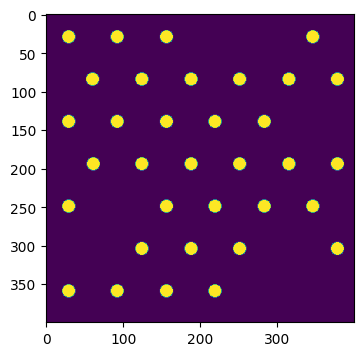

In [12]:
thresh_back = 0.5

latt_S2 = np.zeros((lattice_mask_S2.shape[0],lattice_mask_S2.shape[1]))
for i in range(lattice_mask_S2.shape[0]):
  for j in range(lattice_mask_S2.shape[1]):
    if lattice_mask_S2[i][j] >= thresh_back:
      latt_S2[i][j] = 1.0
    else:
      latt_S2[i][j] = 0.0

plt.figure(figsize=(4,4))
plt.imshow(latt_S2[:400,:400])

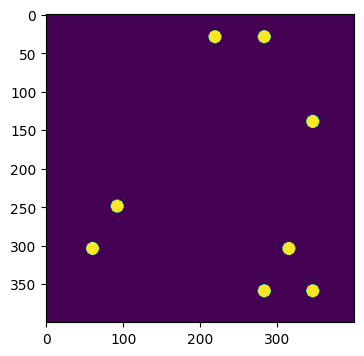

In [13]:
thresh_back = 0.5

latt_S1 = np.zeros((lattice_mask_S1.shape[0],lattice_mask_S1.shape[1]))
for i in range(lattice_mask_S1.shape[0]):
  for j in range(lattice_mask_S1.shape[1]):
    if lattice_mask_S1[i][j] >= thresh_back:
      latt_S1[i][j] = 1.0
    else:
      latt_S1[i][j] = 0.0

plt.figure(figsize=(4,4))
plt.imshow(latt_S1[:400,:400])

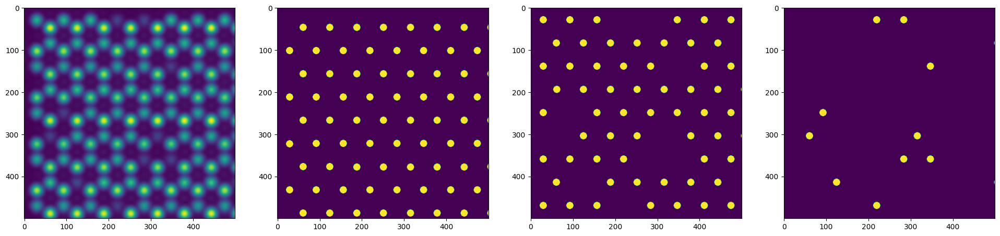

In [14]:
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
axs[0].imshow(lattice_im[:500,:500])
axs[1].imshow(latt_Mo[:500,:500])
axs[2].imshow(latt_S2[:500,:500])
axs[3].imshow(latt_S1[:500,:500])

In [15]:
lattice_mask_bg = 1 - (lattice_mask_Mo + lattice_mask_S2 + lattice_mask_S1)
latt_mask = np.concatenate((latt_Mo[..., None],
                            latt_S2[..., None],
                            latt_S1[..., None],
                            lattice_mask_bg[..., None]
                            ), axis=-1)

print('data type: {}, Min: {}, max: {}'.format(latt_mask.shape, latt_mask.min(), latt_mask.max()))

data type: (1784, 1711, 4), Min: 0.0, max: 1.0


(1784, 1711) (1784, 1711, 4)


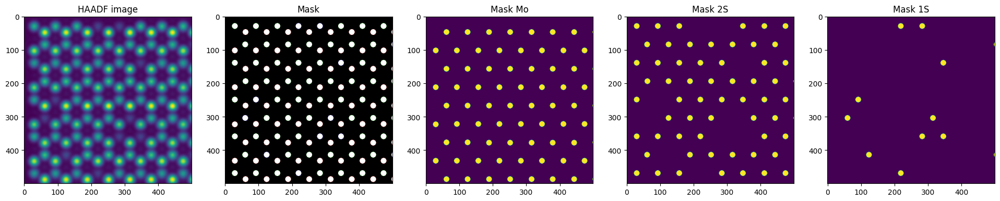

In [16]:
fig, axs = plt.subplots(1, 5, figsize=(24, 15))
axs[0].imshow(lattice_im[:500,:500])
axs[1].imshow(latt_mask[:500,:500, ...])
axs[2].imshow(latt_mask[:500,:500, 0])
axs[3].imshow(latt_mask[:500,:500, 1])
axs[4].imshow(latt_mask[:500,:500, 2])

axs[0].set_title("HAADF image")
axs[1].set_title("Mask")
axs[2].set_title("Mask Mo")
axs[3].set_title("Mask 2S")
axs[4].set_title("Mask 1S")

print(lattice_im.shape, latt_mask.shape)

# Experimental Training Dataset tests

In [17]:
# Experimental Image
!gdown https://drive.google.com/uc?id=1cX_791WI9icT9BmbGC03_nb28hZlvbvf

# Training images and labels
!gdown https://drive.google.com/uc?id=1OcP_FVOznvJzqbr3xZABd-3kRaxi3UWd
!gdown https://drive.google.com/uc?id=1-01EswUvAXiQemT6mZo1eVg7SJzya_QP

Downloading...
From: https://drive.google.com/uc?id=1cX_791WI9icT9BmbGC03_nb28hZlvbvf
To: /content/MoS2_Circle_1.npy
100% 9.83M/9.83M [00:00<00:00, 19.2MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1OcP_FVOznvJzqbr3xZABd-3kRaxi3UWd
From (redirected): https://drive.google.com/uc?id=1OcP_FVOznvJzqbr3xZABd-3kRaxi3UWd&confirm=t&uuid=0c3380d9-05b0-413c-9e2f-47cf450699b9
To: /content/MoS2_sim_image_patches.npy
100% 640M/640M [00:12<00:00, 51.9MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1-01EswUvAXiQemT6mZo1eVg7SJzya_QP
From (redirected): https://drive.google.com/uc?id=1-01EswUvAXiQemT6mZo1eVg7SJzya_QP&confirm=t&uuid=fa46b1e2-0397-420c-82fb-ca6988b6aab1
To: /content/MoS2_sim_mask_patches.npy
100% 2.56G/2.56G [00:25<00:00, 101MB/s]


(2000, 200, 200) (2000, 200, 200, 4)
642


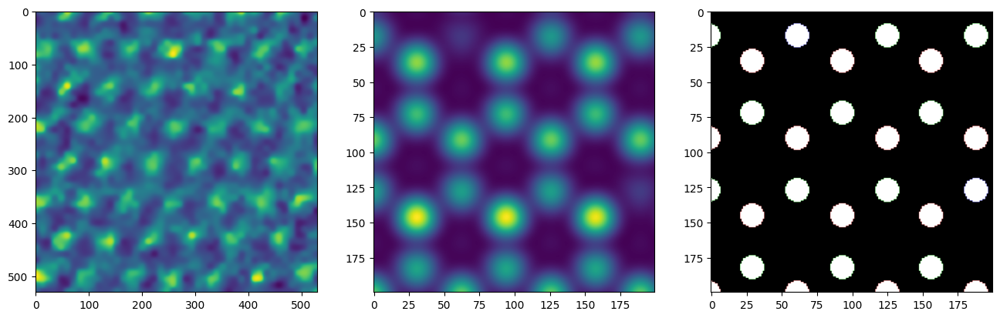

In [19]:
gstem_0 = np.load('MoS2_Circle_1.npy')
gstem_0 = gstem_0[0,...]

gstem_0_rs = aoi.utils.cv_resize(gstem_0, [750,750])
gstem_0_rs = gstem_0_rs[110:640,110:640]
gstem_0_rs = normalize_image(gstem_0_rs)

sigma = 3
gstem_0_rs = filters.gaussian(gstem_0_rs, sigma=sigma)

gstem_0_rs = denoise_tv_chambolle(gstem_0_rs, weight=0.3)

images_gstem_test = np.load('MoS2_sim_image_patches.npy')
labels_gstem_test = np.load('MoS2_sim_mask_patches.npy')

print(images_gstem_test.shape, labels_gstem_test.shape)

k = random.randrange(0, len(images_gstem_test[:,0,0]), 1)
print(k)
fig, axs = plt.subplots(1, 3, figsize=(16, 16))
axs[0].imshow(gstem_0_rs[:,:])
axs[1].imshow(images_gstem_test[k])
axs[2].imshow(labels_gstem_test[k])

### Experimental data transform and pre-process

In [20]:
# Define image distortion/noise parameters - settings from last time I messed around with this

ch = labels_gstem_test.shape[-1]

zoom = True # zoom factor
poisson = [30, 45] # P noise range (scaled units)
gauss = [5000, 8000] # G noise range (scaled units)
blur = [25,50] # Blurring range (scaled units)
contrast = [10, 20] # contrast range (< 10 is brighter, > 10 is darker)
salt_and_pepper = [2, 5] # min/max amount of salted/peppered pixels (scaled units)
background = False
resize=1.5


dt = aoi.transforms.datatransform(n_channels=ch,
                                  dim_order_in='channel_last',
                                  dim_order_out='channel_first',
                                  gauss_noise=gauss,
                                  poisson_noise=poisson,
                                  salt_and_pepper=salt_and_pepper,
                                  contrast=contrast,
                                  blur=blur,
                                  resize=resize,
                                  zoom=zoom,
                                  rotation=True,
                                  background=background,
                                  squeeze_channels=True,
                                  seed=42
                                  )
gstem_X_train, gstem_y_train = dt.run(images_gstem_test, labels_gstem_test)

print(gstem_X_train.shape, gstem_y_train.shape)

print('data type: {}, Min: {}, max: {}'.format(gstem_X_train.dtype, gstem_X_train.min(), gstem_X_train.max()))
print('data type: {}, Min: {}, max: {}'.format(gstem_y_train.dtype, gstem_y_train.min(), gstem_y_train.max()))
print(gstem_X_train[0].shape)

(1521, 1, 200, 200) (1521, 200, 200)
data type: float64, Min: 0.0, max: 1.0
data type: float64, Min: 0.0, max: 3.0
(1, 200, 200)


In [22]:
gstem_X_train_rs = np.zeros((len(gstem_X_train[:]), 1, 200, 200))

for i in range(len(gstem_X_train[:])):
  gstem_X_train_rs[i] = normalize_image(gstem_X_train[i])

  sigma = 3
  gstem_X_train_rs[i] = filters.gaussian(gstem_X_train_rs[i], sigma=sigma)

  gstem_X_train_rs[i] = denoise_tv_chambolle(gstem_X_train_rs[i], weight=0.3)

1172


Text(0.5, 1.0, 'Mask')

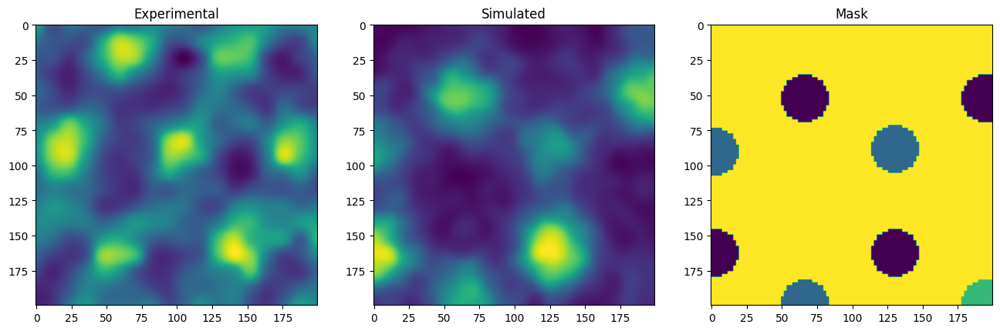

In [24]:
k = random.randrange(0, len(gstem_X_train[:,0,0,0]), 1)
print(k)
fig, axs = plt.subplots(1, 3, figsize=(16, 16))
axs[0].imshow(gstem_0_rs[200:400,200:400])
axs[0].set_title("Experimental")
axs[1].imshow(gstem_X_train_rs[k,0])
axs[1].set_title("Simulated")
axs[2].imshow(gstem_y_train[k])
axs[2].set_title("Mask")

# ELIT GSTEM

### Load and apply

In [6]:
# Download X and Y training datasets
!gdown https://drive.google.com/uc?id=1o8b-DHf07K1XiZMe2mk7l8Bko9Vp0wOB
!gdown https://drive.google.com/uc?id=17cwEXUS_1DWzZmEQaVByvYNKFD1L5kzm

gstem_train_img_all = np.load('X_train_MoS2_sim_gstem_rs.npy')
gstem_train_labels_all = np.load('y_train_MoS2_sim_gstem.npy')

Downloading...
From (original): https://drive.google.com/uc?id=1o8b-DHf07K1XiZMe2mk7l8Bko9Vp0wOB
From (redirected): https://drive.google.com/uc?id=1o8b-DHf07K1XiZMe2mk7l8Bko9Vp0wOB&confirm=t&uuid=c0aff488-c002-478f-9151-d4895e338c91
To: /content/X_train_MoS2_sim_gstem_rs.npy
100% 483M/483M [00:03<00:00, 130MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=17cwEXUS_1DWzZmEQaVByvYNKFD1L5kzm
From (redirected): https://drive.google.com/uc?id=17cwEXUS_1DWzZmEQaVByvYNKFD1L5kzm&confirm=t&uuid=537f7355-e03f-4b8d-9bb0-88542a0c081e
To: /content/y_train_MoS2_sim_gstem.npy
100% 483M/483M [00:01<00:00, 267MB/s]


1078


Text(0.5, 1.0, 'Simulated')

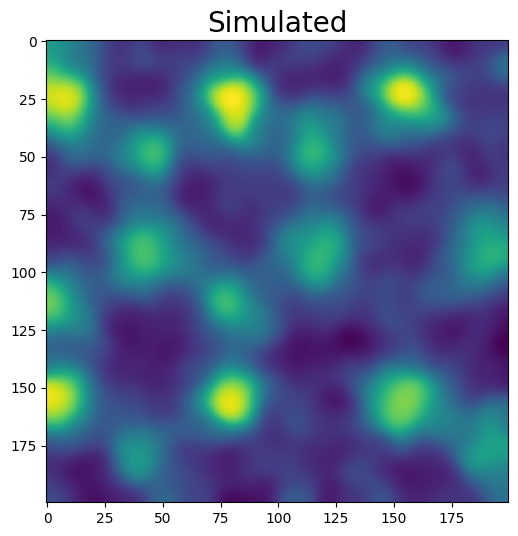

In [7]:
k = random.randrange(0, len(gstem_train_img_all[:,0,0,0]), 1)
print(k)
fig, axs = plt.subplots(1, 1, figsize=(6, 6))
axs.imshow(gstem_train_img_all[k,0])
axs.set_title("Simulated", fontsize=20)

Text(0.5, 1.0, 'Mask')

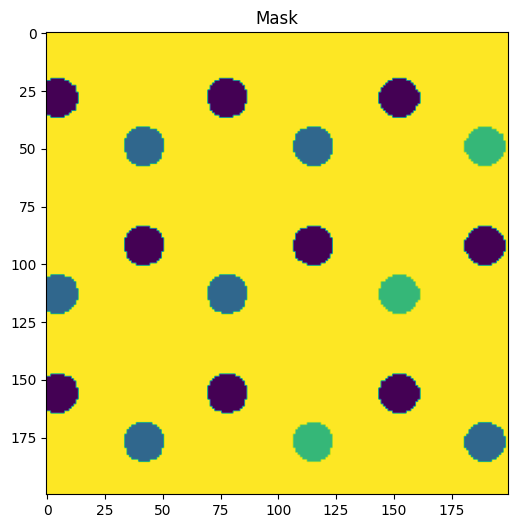

In [8]:
fig, axs = plt.subplots(1, 1, figsize=(6, 6))
axs.imshow(gstem_train_labels_all[k])
axs.set_title("Mask")

Training ensemble models (strategy = 'from_scratch')

Ensemble model 1
Epoch 1/1 ... Training loss: 1.7359 ... Test loss: 1.395 ... GPU memory usage: 3903/15360
Model (final state) evaluation loss: 1.3949
Plotting training history


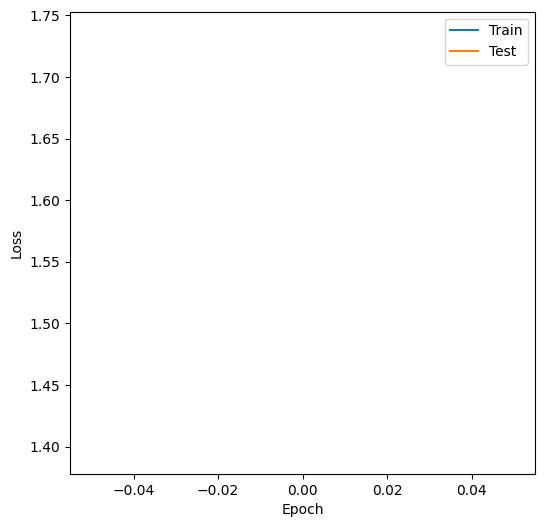


Ensemble model 2
Epoch 1/1 ... Training loss: 1.6505 ... Test loss: 1.384 ... GPU memory usage: 3883/15360
Model (final state) evaluation loss: 1.3839
Plotting training history


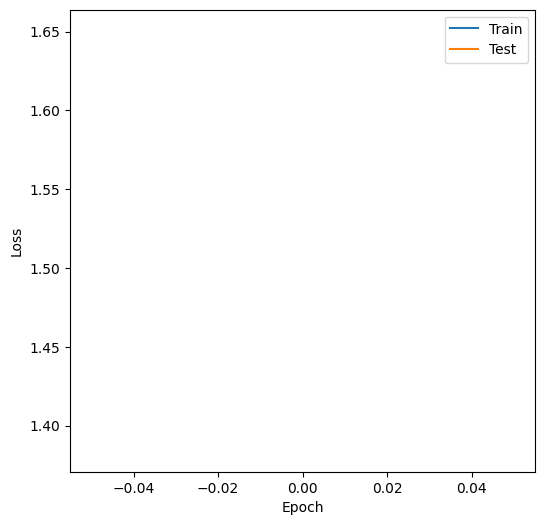


Ensemble model 3
Epoch 1/1 ... Training loss: 1.7787 ... Test loss: 1.3465 ... GPU memory usage: 3883/15360
Model (final state) evaluation loss: 1.3465
Plotting training history


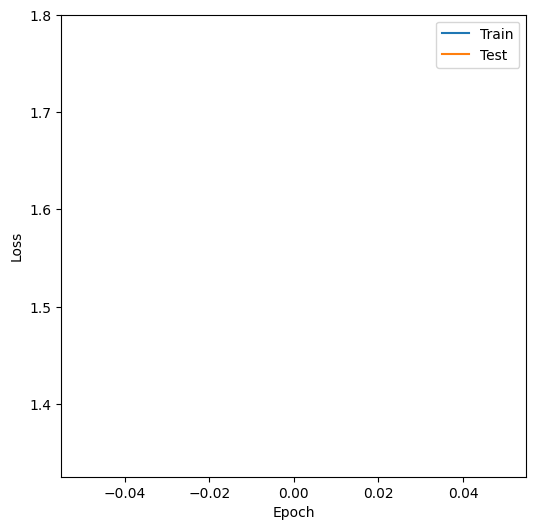


Ensemble model 4
Epoch 1/1 ... Training loss: 1.8542 ... Test loss: 1.3748 ... GPU memory usage: 3885/15360
Model (final state) evaluation loss: 1.3749
Plotting training history


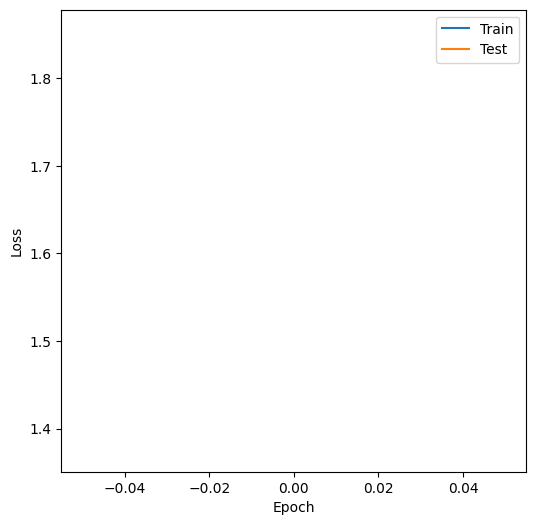


Ensemble model 5
Epoch 1/1 ... Training loss: 1.8552 ... Test loss: 1.395 ... GPU memory usage: 3887/15360
Model (final state) evaluation loss: 1.3949
Plotting training history


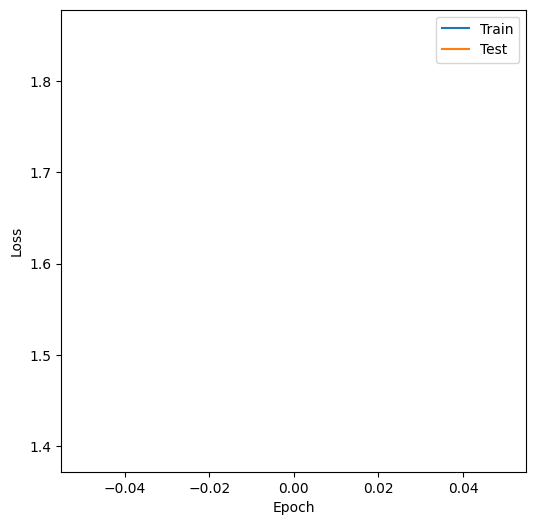


Ensemble model 6
Epoch 1/1 ... Training loss: 2.0519 ... Test loss: 1.36 ... GPU memory usage: 3889/15360
Model (final state) evaluation loss: 1.36
Plotting training history


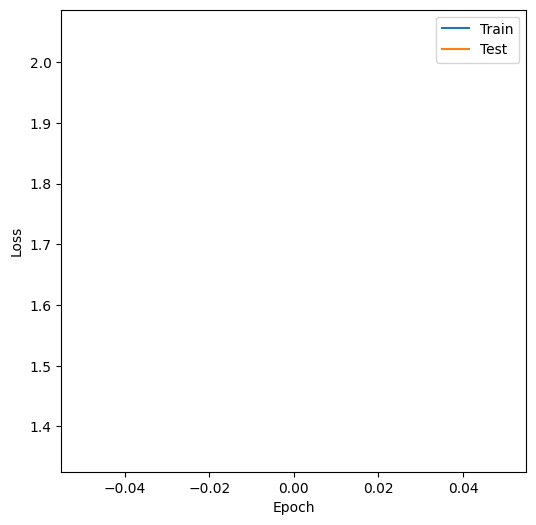


Ensemble model 7
Epoch 1/1 ... Training loss: 2.0434 ... Test loss: 1.3374 ... GPU memory usage: 3891/15360
Model (final state) evaluation loss: 1.3374
Plotting training history


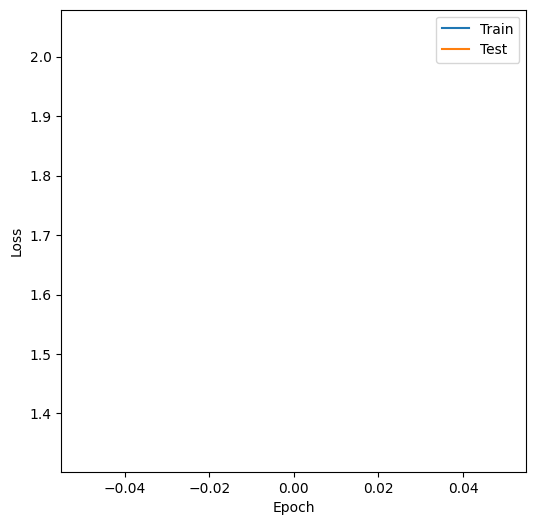


Ensemble model 8
Epoch 1/1 ... Training loss: 1.9272 ... Test loss: 1.4332 ... GPU memory usage: 3893/15360
Model (final state) evaluation loss: 1.433
Plotting training history


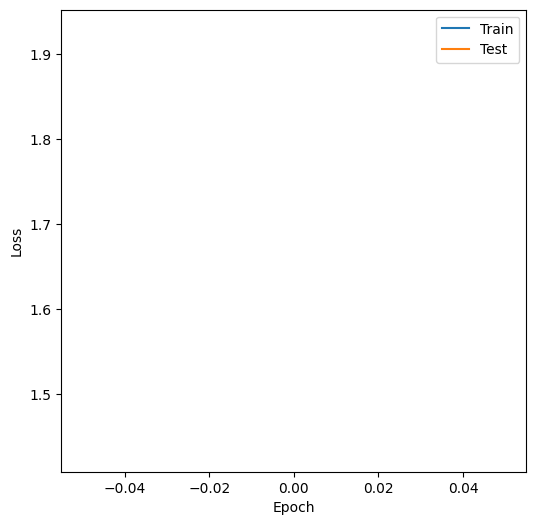


Ensemble model 9
Epoch 1/1 ... Training loss: 1.7343 ... Test loss: 1.4052 ... GPU memory usage: 3895/15360
Model (final state) evaluation loss: 1.4052
Plotting training history


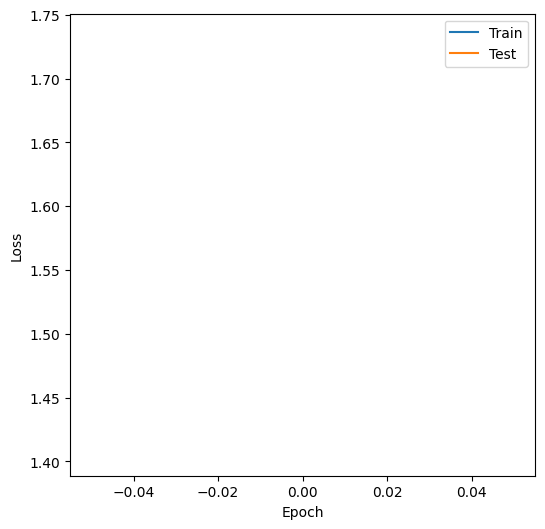


Ensemble model 10
Epoch 1/1 ... Training loss: 1.7167 ... Test loss: 1.3738 ... GPU memory usage: 3899/15360
Model (final state) evaluation loss: 1.3739
Plotting training history


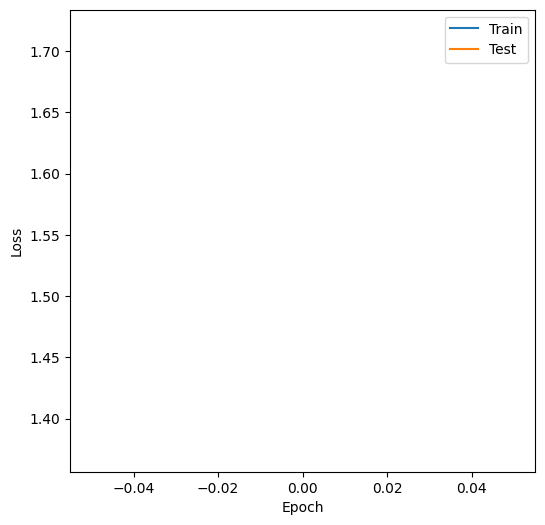


Ensemble model 11
Epoch 1/1 ... Training loss: 1.8223 ... Test loss: 1.4017 ... GPU memory usage: 3901/15360
Model (final state) evaluation loss: 1.4016
Plotting training history


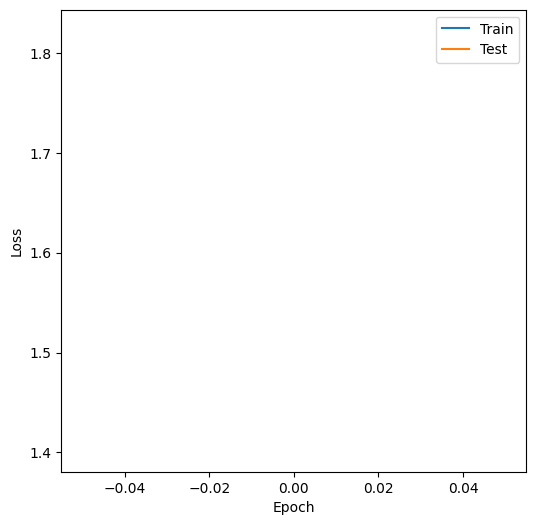


Ensemble model 12
Epoch 1/1 ... Training loss: 1.8023 ... Test loss: 1.3415 ... GPU memory usage: 3903/15360
Model (final state) evaluation loss: 1.3415
Plotting training history


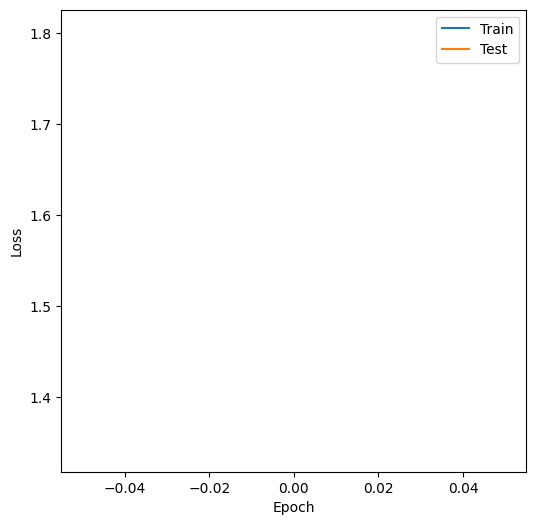


Ensemble model 13
Epoch 1/1 ... Training loss: 1.7289 ... Test loss: 1.3879 ... GPU memory usage: 3905/15360
Model (final state) evaluation loss: 1.3879
Plotting training history


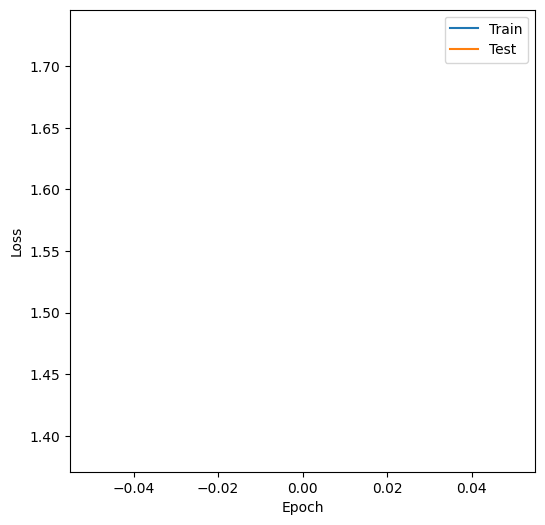


Ensemble model 14
Epoch 1/1 ... Training loss: 1.83 ... Test loss: 1.3845 ... GPU memory usage: 3907/15360
Model (final state) evaluation loss: 1.3846
Plotting training history


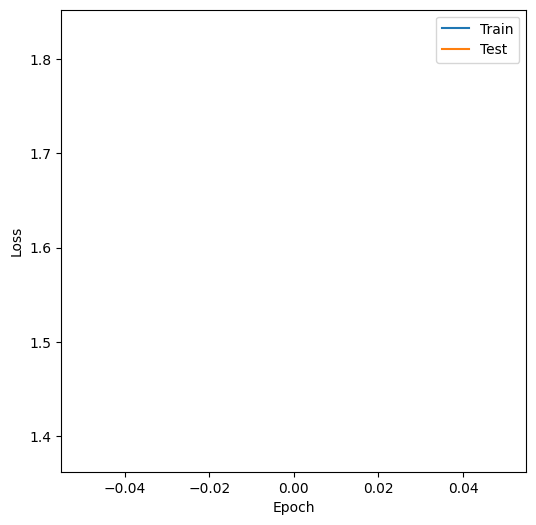


Ensemble model 15
Epoch 1/1 ... Training loss: 1.9926 ... Test loss: 1.3797 ... GPU memory usage: 3909/15360
Model (final state) evaluation loss: 1.3804
Plotting training history


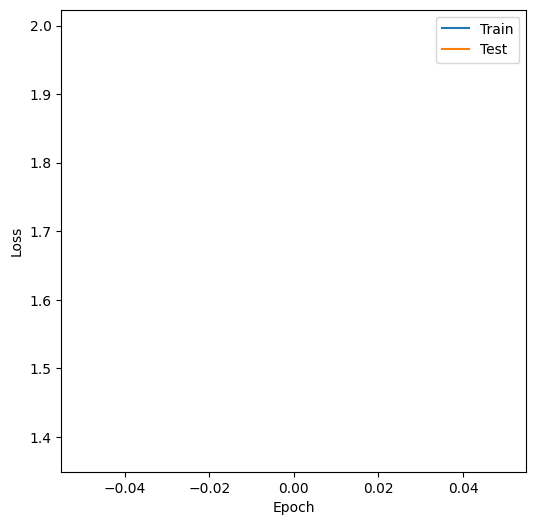


Ensemble model 16
Epoch 1/1 ... Training loss: 1.7207 ... Test loss: 1.3856 ... GPU memory usage: 3911/15360
Model (final state) evaluation loss: 1.3856
Plotting training history


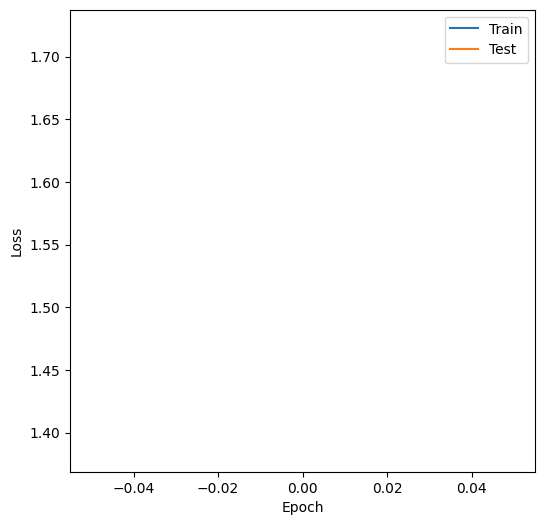


Ensemble model 17
Epoch 1/1 ... Training loss: 1.8663 ... Test loss: 1.3471 ... GPU memory usage: 3915/15360
Model (final state) evaluation loss: 1.3467
Plotting training history


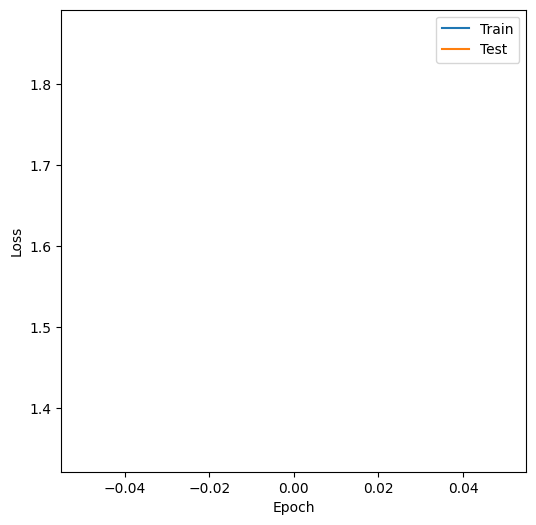


Ensemble model 18
Epoch 1/1 ... Training loss: 1.8388 ... Test loss: 1.349 ... GPU memory usage: 3917/15360
Model (final state) evaluation loss: 1.3488
Plotting training history


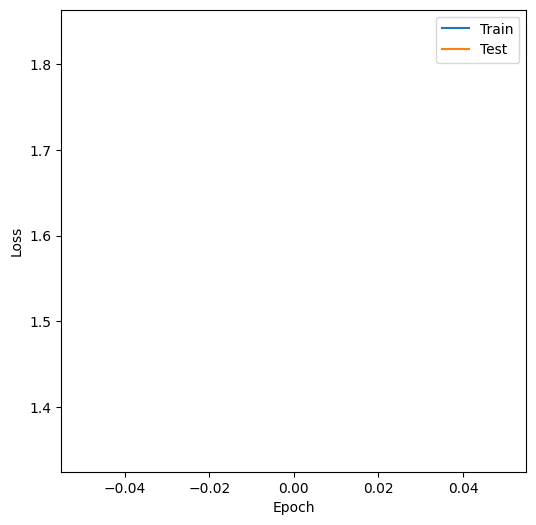


Ensemble model 19
Epoch 1/1 ... Training loss: 1.679 ... Test loss: 1.3818 ... GPU memory usage: 3919/15360
Model (final state) evaluation loss: 1.3817
Plotting training history


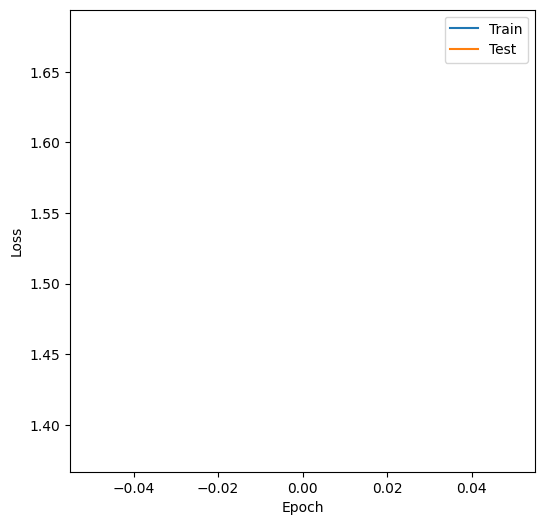


Ensemble model 20
Epoch 1/1 ... Training loss: 1.8966 ... Test loss: 1.3616 ... GPU memory usage: 3921/15360
Model (final state) evaluation loss: 1.3616
Plotting training history


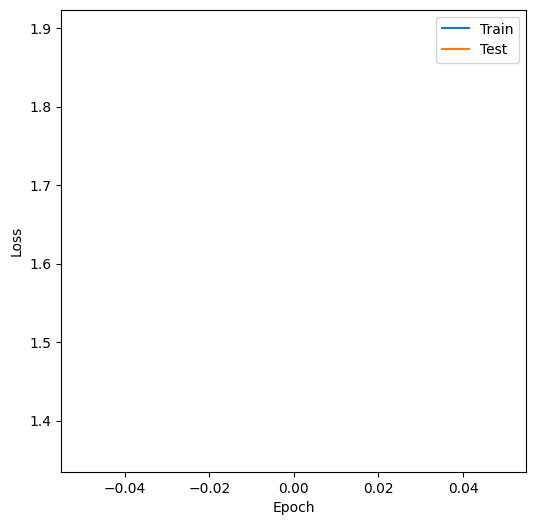

Downloading...
From: https://drive.google.com/uc?id=1VzUsnconpF3_QIIP-SEoVStwr7WubQTV
To: /content/ELIT_MoS2_GSTEM_v2_ensemble_metadict.tar
100% 48.3M/48.3M [00:00<00:00, 52.6MB/s]


In [9]:
train_new = False

if train_new:
  etrainer = aoi.trainers.EnsembleTrainer("Unet", nb_classes=4, with_dilation=False,
                                          batch_norm=True)

  etrainer.compile_ensemble_trainer(training_cycles=300, compute_accuracy=True, swa=True, memory_alloc=0.5, filename="ELIT_MoS2_GSTEM_v6")

  smodel, ensemble = etrainer.train_ensemble_from_scratch(gstem_train_img_all, gstem_train_labels_all, n_models=20)

else:
  etrainer = aoi.trainers.EnsembleTrainer("Unet", nb_classes=4, with_dilation=False,
                                          batch_norm=True)

  etrainer.compile_ensemble_trainer(training_cycles=1)

  smodel, ensemble = etrainer.train_ensemble_from_scratch(gstem_train_img_all, gstem_train_labels_all, n_models=20, filename="/new_gstem")

  # Download model
  !gdown https://drive.google.com/uc?id=1VzUsnconpF3_QIIP-SEoVStwr7WubQTV

  # Load weights from the old model and put into the new ensemble format

  ensemble_old = torch.load("ELIT_MoS2_GSTEM_v2_ensemble_metadict.tar")["weights"]

  for i in range(len(ensemble)):
      ensemble[i] = ensemble_old[i]

  etrainer.save_ensemble_metadict()

  # load back the ensemble with new weigths:
  smodel, ensemble = aoi.models.load_ensemble("/new_gstem_ensemble_metadict.tar")

## Model Application

In [10]:
# Download experimental data
!gdown https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2

file_name = 'MoS2_Circle_3_gstem_rs'
gstem_test_load = np.load(file_name+'.npy')

Downloading...
From (original): https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2
From (redirected): https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2&confirm=t&uuid=5d26c331-f519-4e76-afce-9c21fdc2a767
To: /content/MoS2_Circle_3_gstem_rs.npy
100% 674M/674M [00:06<00:00, 112MB/s]


Batch 1/1

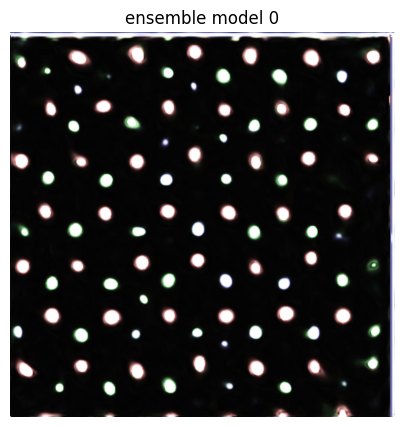

Batch 1/1

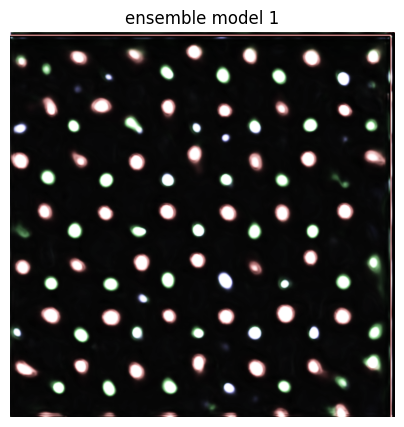

Batch 1/1

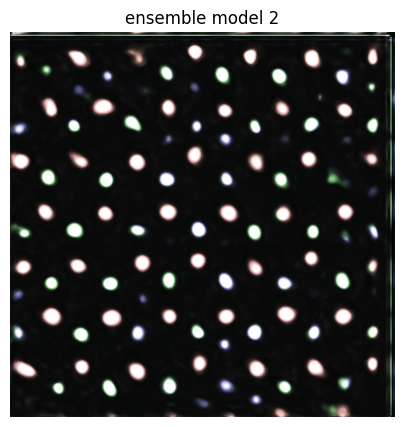

Batch 1/1

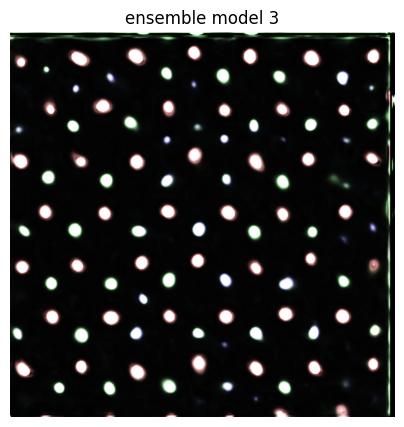

Batch 1/1

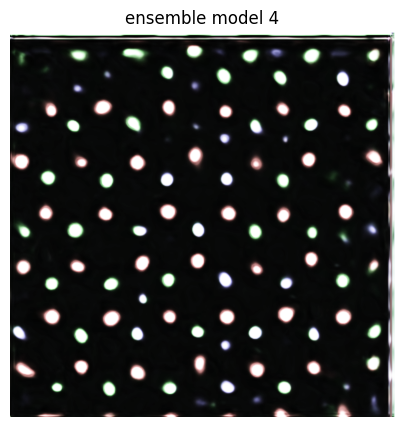

Batch 1/1

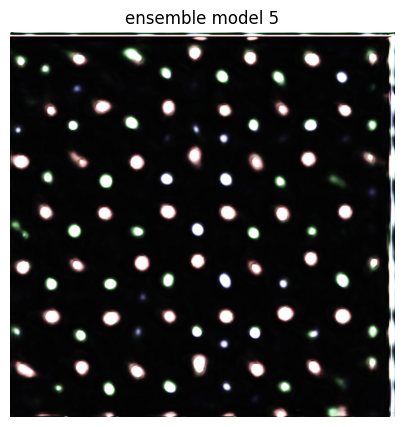

Batch 1/1

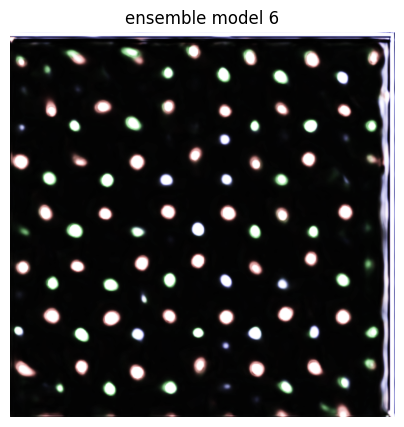

Batch 1/1

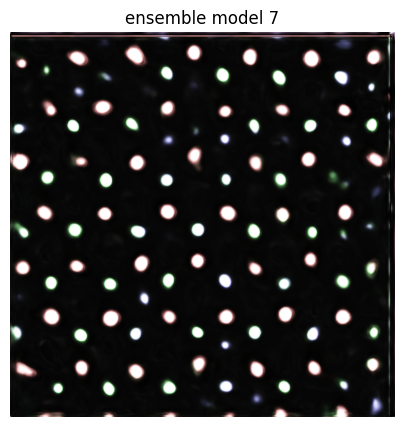

Batch 1/1

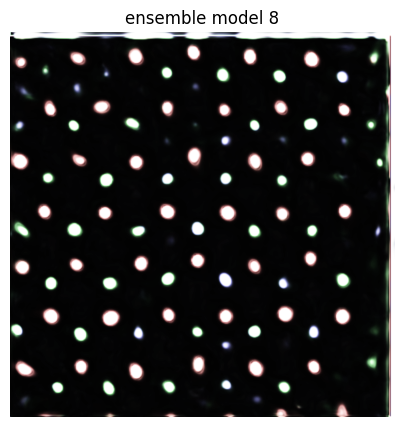

Batch 1/1

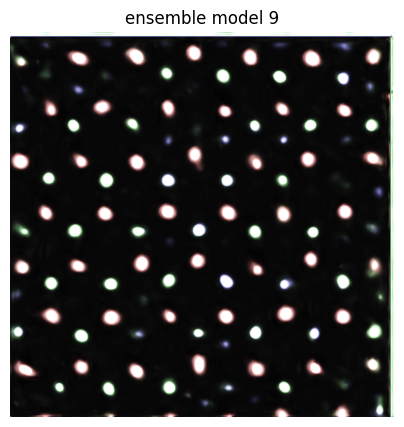

Batch 1/1

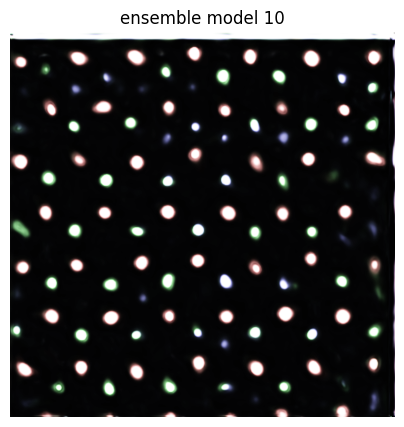

Batch 1/1

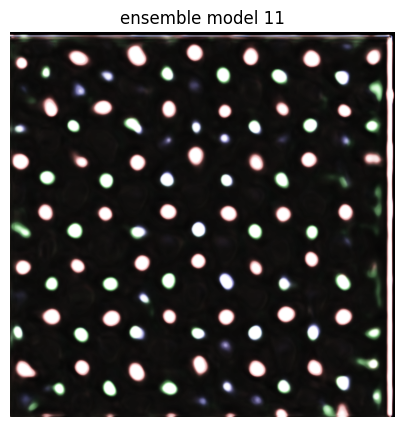

Batch 1/1

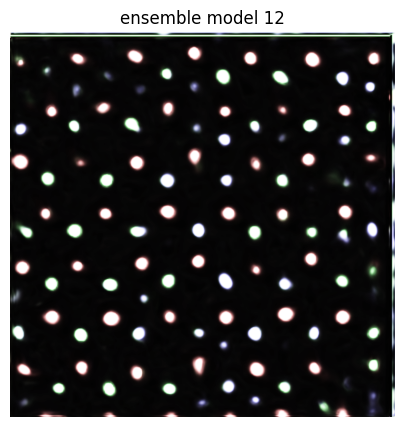

Batch 1/1

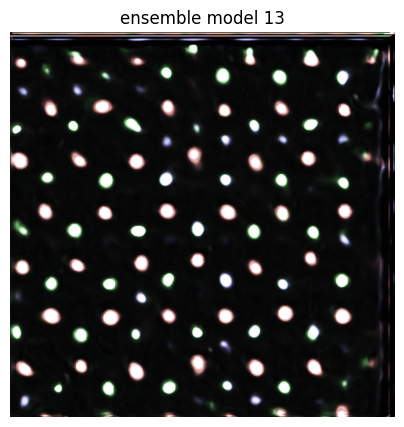

Batch 1/1

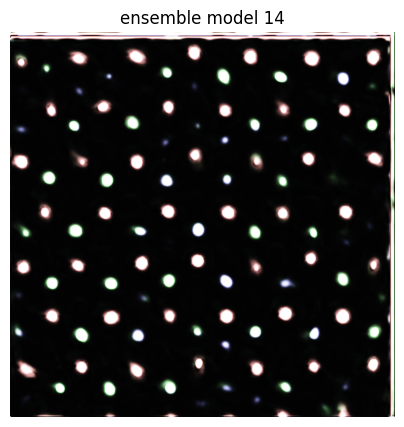

Batch 1/1

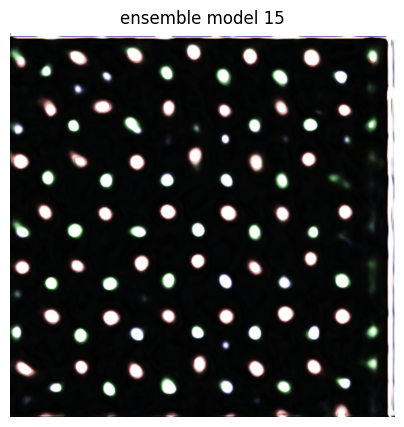

Batch 1/1

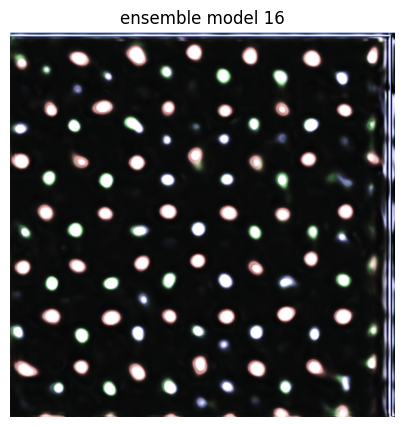

Batch 1/1

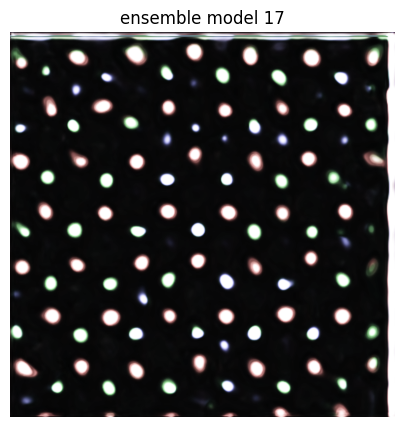

Batch 1/1

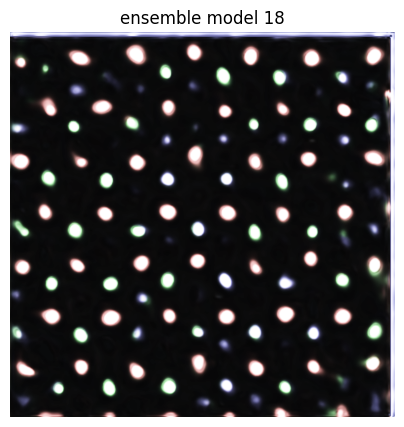

Batch 1/1

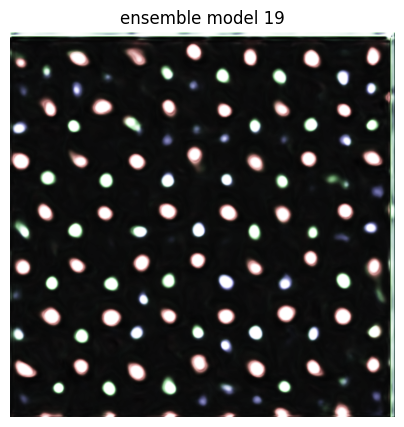

In [11]:
exp_img = gstem_test_load[0]

for i, m in enumerate(ensemble.values()):
    smodel.load_state_dict(m)
    p = aoi.predictors.SegPredictor(smodel, use_gpu=True)
    nn_out = p.predict(exp_img)
    plt.figure(figsize=(5, 5))
    plt.imshow(nn_out[0, :, :, ...], origin="lower", cmap='jet', interpolation="Gaussian")
    plt.title("ensemble model {}".format(i))
    plt.axis('off')
    plt.show()

MoS2_Circle_3_gstem_rs


(530, 530)

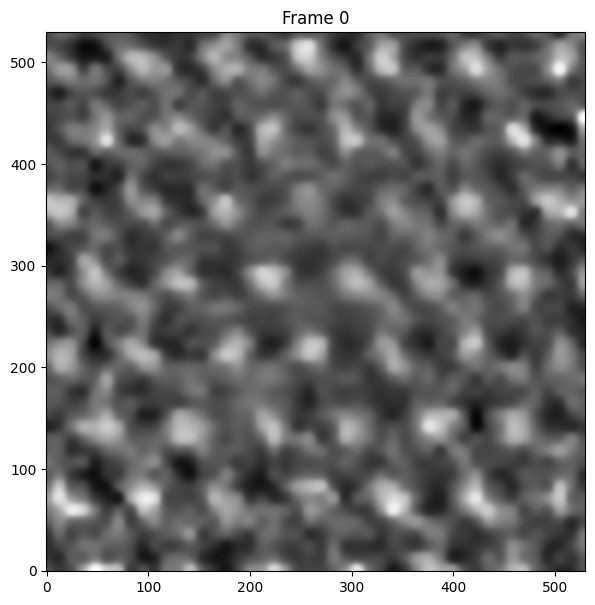

In [12]:
k3 = 0

fig, ax = plt.subplots(1, 1, figsize=(7, 7))
ax.imshow(gstem_test_load[k3,:,:], cmap='gray', origin="lower")  #200:1040,160:900 large triangle 2-3
ax.set_title("Frame {}".format(k3))
# plt.axis('off')
print(str(file_name))

gstem_test_load[k3,:,:].shape    #Circle - 10:520

In [13]:
smodel.load_state_dict(ensemble[7])

dataset = gstem_test_load[:,10:520,10:520]

gstem_test_decoded, gstem_coord = aoi.predictors.SegPredictor(smodel, use_gpu=True, thresh=0.4).run(dataset)

Batch 300/300
300 images were decoded in approximately 15.0248 seconds


Text(0.5, 1.0, 'Frame 299')

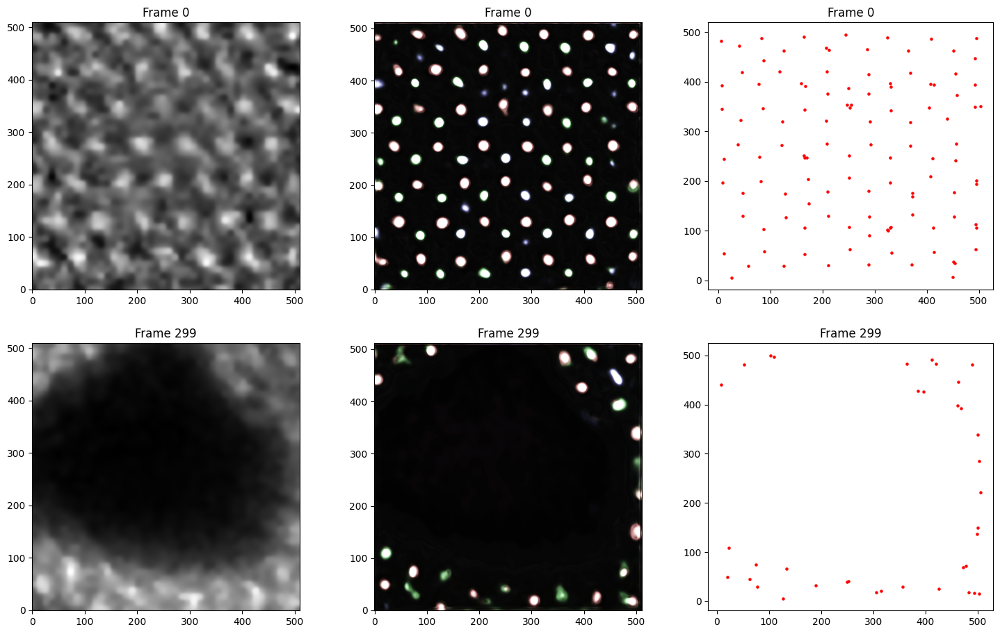

In [14]:
k1, k2 = 0, len(dataset)-1 # frame at the beginning and at the end of STEM movie
fig, ax = plt.subplots(2, 3, figsize=(18, 11))
ax[0,0].imshow(dataset[k1], cmap='gray', origin="lower")
ax[0,0].set_title("Frame {}".format(k1))
ax[0,1].imshow(gstem_test_decoded[k1,...].squeeze(), origin="lower")
ax[0,1].set_title("Frame {}".format(k1))
ax[0,2].scatter(gstem_coord[k1][:,1], gstem_coord[k1][:,0], c='r', s=5)
ax[0,2].set_title("Frame {}".format(k1))
ax[1,0].imshow(dataset[k2], cmap='gray', origin="lower")
ax[1,0].set_title("Frame {}".format(k2))
ax[1,1].imshow(gstem_test_decoded[k2,...].squeeze(), origin="lower")
ax[1,1].set_title("Frame {}".format(k2))
ax[1,2].scatter(gstem_coord[k2][:,1], gstem_coord[k2][:,0], c='r', s=5)
ax[1,2].set_title("Frame {}".format(k2))

## Variance

In [16]:
# Download X and Y training datasets
!gdown https://drive.google.com/uc?id=1o8b-DHf07K1XiZMe2mk7l8Bko9Vp0wOB
!gdown https://drive.google.com/uc?id=17cwEXUS_1DWzZmEQaVByvYNKFD1L5kzm

gstem_train_img_all = np.load('X_train_MoS2_sim_gstem_rs.npy')
gstem_train_labels_all = np.load('y_train_MoS2_sim_gstem.npy')

Downloading...
From (original): https://drive.google.com/uc?id=1o8b-DHf07K1XiZMe2mk7l8Bko9Vp0wOB
From (redirected): https://drive.google.com/uc?id=1o8b-DHf07K1XiZMe2mk7l8Bko9Vp0wOB&confirm=t&uuid=c1cc9da3-9975-46fc-af26-dfbd6aa83c7f
To: /content/X_train_MoS2_sim_gstem_rs.npy
100% 483M/483M [00:07<00:00, 66.5MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=17cwEXUS_1DWzZmEQaVByvYNKFD1L5kzm
From (redirected): https://drive.google.com/uc?id=17cwEXUS_1DWzZmEQaVByvYNKFD1L5kzm&confirm=t&uuid=27feb08c-a4d3-4ddc-b31d-801533d3a7cd
To: /content/y_train_MoS2_sim_gstem.npy
100% 483M/483M [00:04<00:00, 120MB/s]


In [17]:
def normalize(image):
  return (image-np.min(image))/np.ptp(image)

In [18]:
H, W = 128,128
images_all = dc(gstem_train_img_all)
labels_all = dc(gstem_train_labels_all)

images_all_D = np.zeros((len(images_all), 1, H, W))
labels_all_D = np.zeros((len(images_all),H,W))

for ii, img in enumerate(images_all):
  images_all_D[ii] = normalize(np.expand_dims(aoi.utils.cv_resize(img[0], (H,W)),0))

for ii,img in enumerate(labels_all):
  img[np.where(img < 2.5)] = 0
  downed = normalize(aoi.utils.cv_resize(img, (H,W)))
  downed = 1-downed
  downed[np.where(downed > 0.25)] = 1
  downed[np.where(downed <= 0.25)] = 0
  labels_all_D[ii] = downed

0.0 1.0


(0.0, 1.0, 0.0, 1.0)

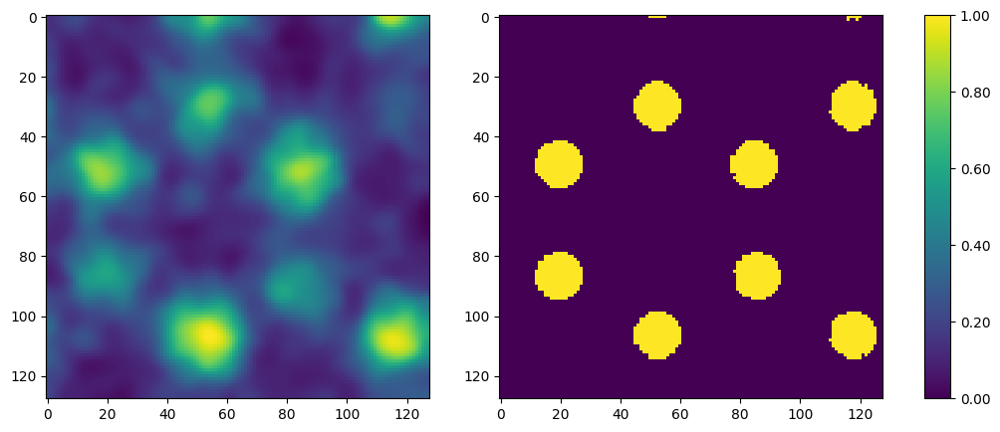

In [19]:
kk = 50
print(images_all_D[kk].min(), images_all_D[kk].max())

plt.figure(figsize=(12,5))
gs = gridspec.GridSpec(1,3,width_ratios=[1,1,0.05])
ax1,ax2,ax3 = plt.subplot(gs[0]),plt.subplot(gs[1]),plt.subplot(gs[2])

ax1.imshow(images_all_D[kk,0])
im2 = ax2.imshow(labels_all_D[kk])

cbar = plt.colorbar(im2,ax=ax3,aspect = 15, fraction = 2, format="%.2f")
ax3.axis('off')

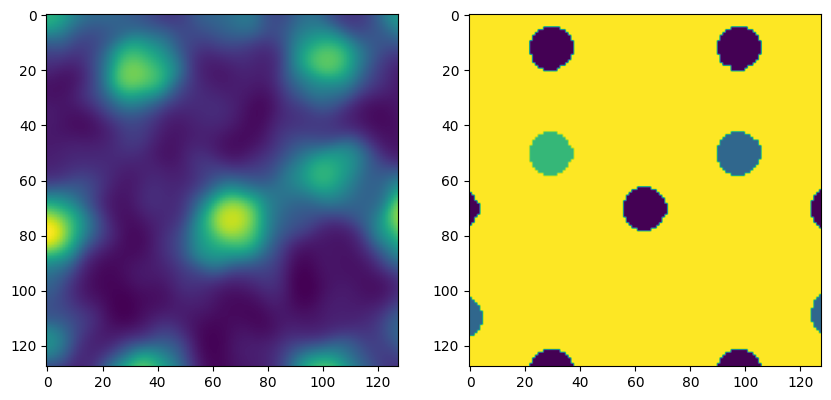

In [20]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(gstem_train_img_all[0,0,:H,:W])
ax[1].imshow(gstem_train_labels_all[0,5:5+H,5:5+W])

Training ensemble models (strategy = 'from_scratch')

Ensemble model 1
Epoch 1/1 ... Training loss: 1.7359 ... Test loss: 1.395 ... GPU memory usage: 4179/15360
Model (final state) evaluation loss: 1.3948
Plotting training history


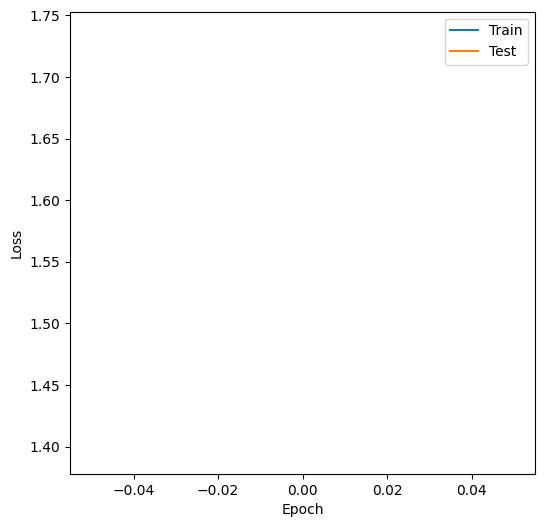


Ensemble model 2
Epoch 1/1 ... Training loss: 1.6505 ... Test loss: 1.384 ... GPU memory usage: 4143/15360
Model (final state) evaluation loss: 1.3839
Plotting training history


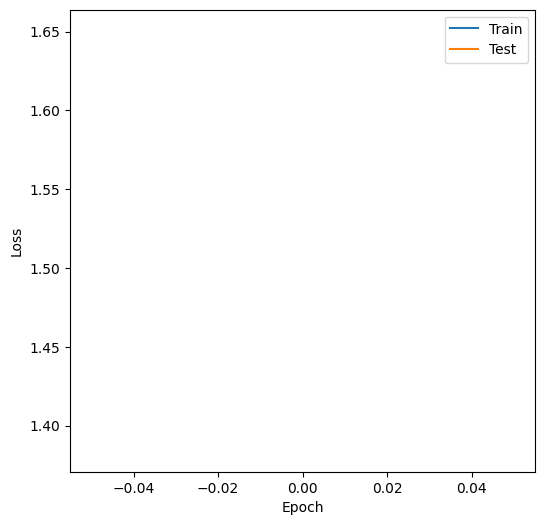


Ensemble model 3
Epoch 1/1 ... Training loss: 1.7787 ... Test loss: 1.3465 ... GPU memory usage: 4187/15360
Model (final state) evaluation loss: 1.3465
Plotting training history


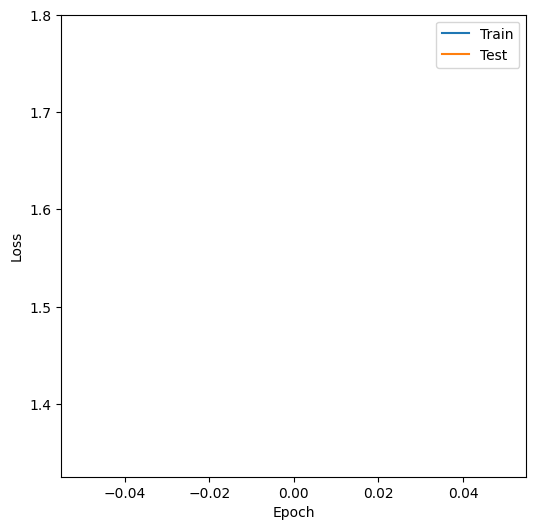


Ensemble model 4
Epoch 1/1 ... Training loss: 1.8542 ... Test loss: 1.3748 ... GPU memory usage: 4143/15360
Model (final state) evaluation loss: 1.3749
Plotting training history


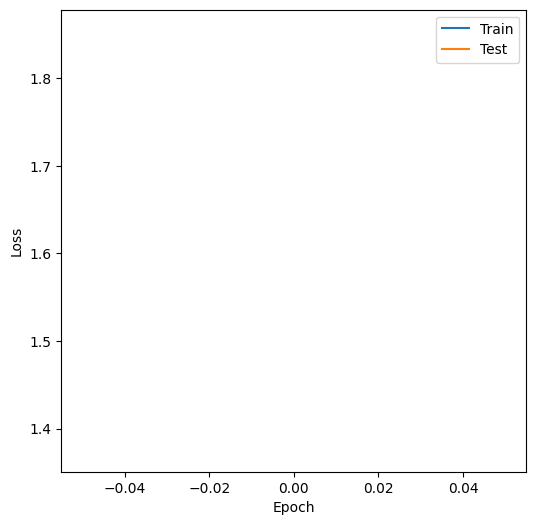


Ensemble model 5
Epoch 1/1 ... Training loss: 1.8552 ... Test loss: 1.395 ... GPU memory usage: 4187/15360
Model (final state) evaluation loss: 1.3949
Plotting training history


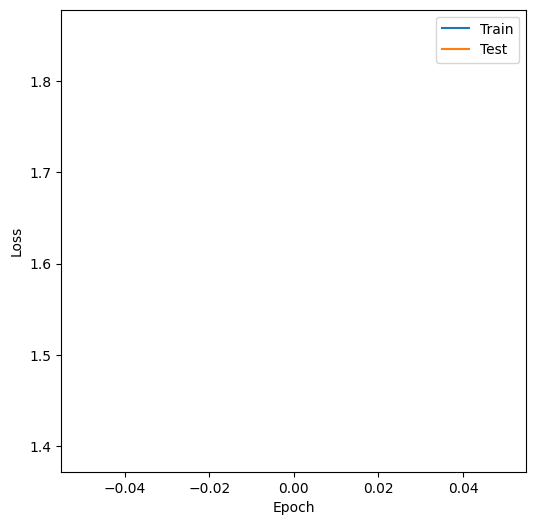


Ensemble model 6
Epoch 1/1 ... Training loss: 2.0519 ... Test loss: 1.3593 ... GPU memory usage: 4143/15360
Model (final state) evaluation loss: 1.3593
Plotting training history


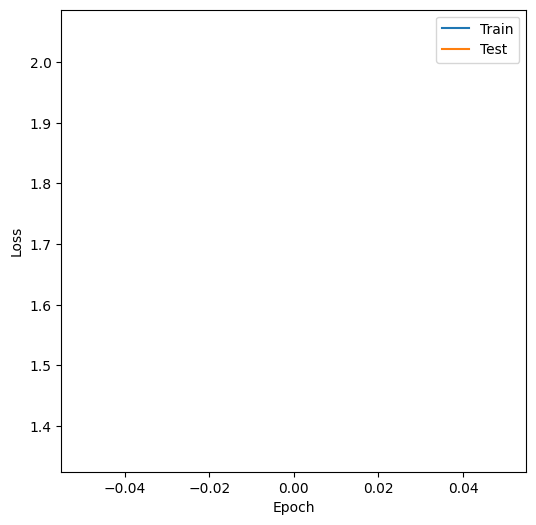


Ensemble model 7
Epoch 1/1 ... Training loss: 2.0434 ... Test loss: 1.3374 ... GPU memory usage: 4187/15360
Model (final state) evaluation loss: 1.3374
Plotting training history


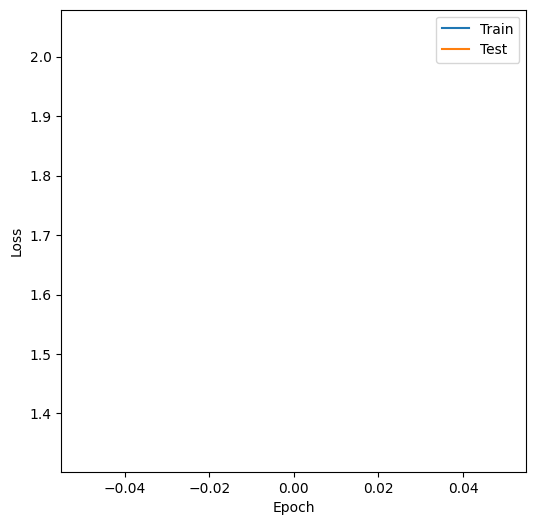


Ensemble model 8
Epoch 1/1 ... Training loss: 1.9272 ... Test loss: 1.4332 ... GPU memory usage: 4143/15360
Model (final state) evaluation loss: 1.433
Plotting training history


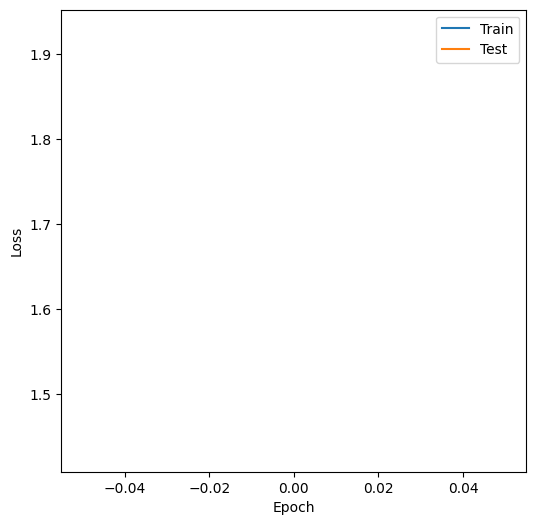


Ensemble model 9
Epoch 1/1 ... Training loss: 1.7343 ... Test loss: 1.4051 ... GPU memory usage: 4187/15360
Model (final state) evaluation loss: 1.4052
Plotting training history


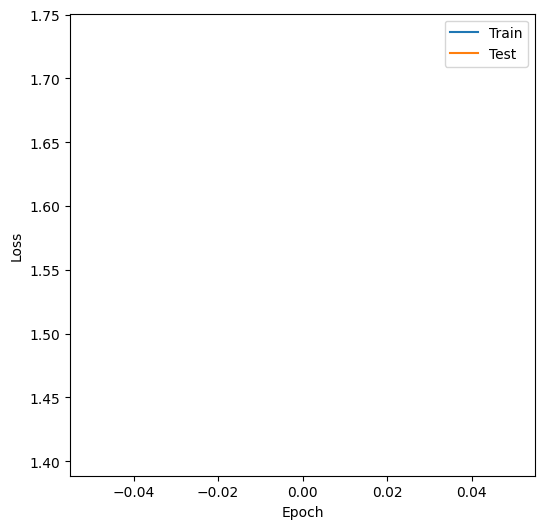


Ensemble model 10
Epoch 1/1 ... Training loss: 1.7167 ... Test loss: 1.3738 ... GPU memory usage: 4143/15360
Model (final state) evaluation loss: 1.3739
Plotting training history


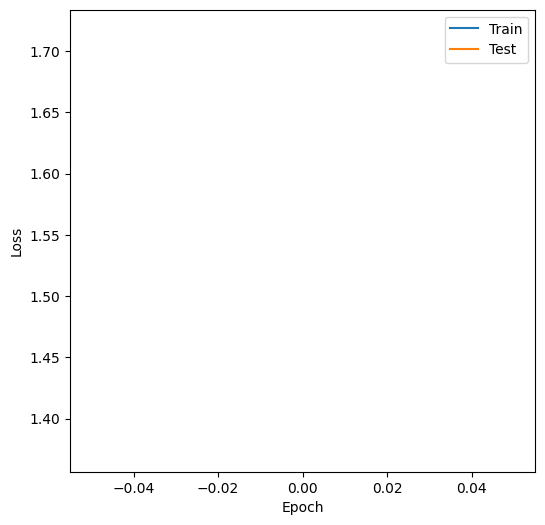


Ensemble model 11
Epoch 1/1 ... Training loss: 1.8223 ... Test loss: 1.4018 ... GPU memory usage: 4187/15360
Model (final state) evaluation loss: 1.4017
Plotting training history


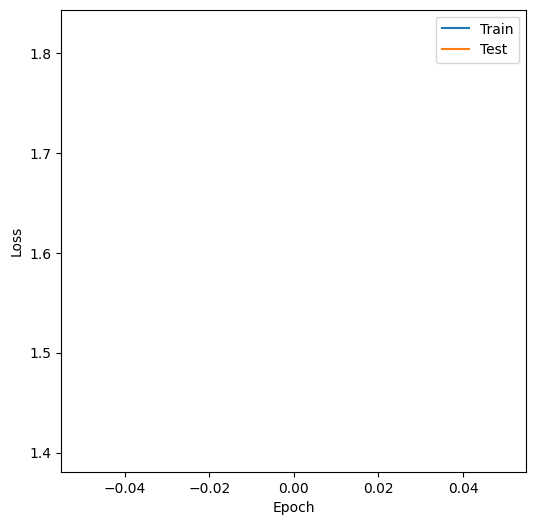


Ensemble model 12
Epoch 1/1 ... Training loss: 1.8023 ... Test loss: 1.3415 ... GPU memory usage: 4143/15360
Model (final state) evaluation loss: 1.3414
Plotting training history


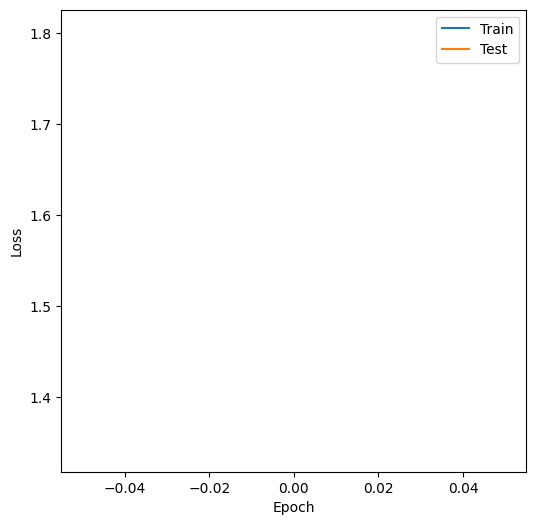


Ensemble model 13
Epoch 1/1 ... Training loss: 1.7289 ... Test loss: 1.3879 ... GPU memory usage: 4189/15360
Model (final state) evaluation loss: 1.3879
Plotting training history


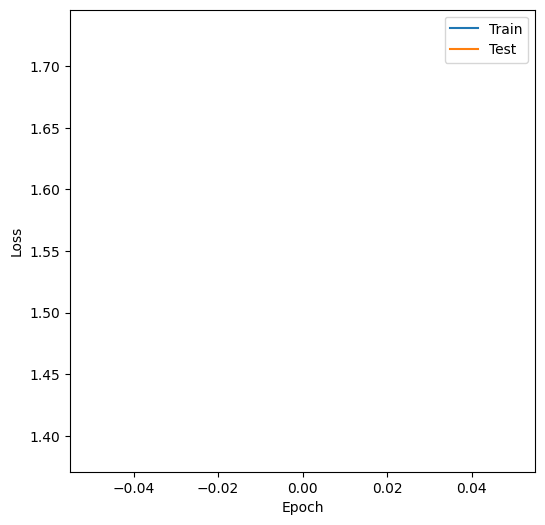


Ensemble model 14
Epoch 1/1 ... Training loss: 1.83 ... Test loss: 1.3837 ... GPU memory usage: 4147/15360
Model (final state) evaluation loss: 1.3838
Plotting training history


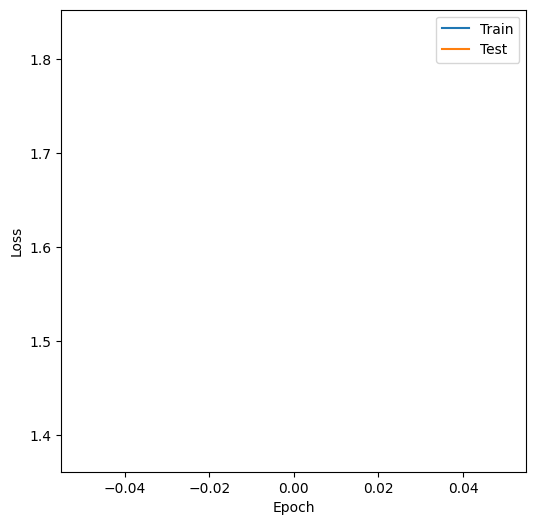


Ensemble model 15
Epoch 1/1 ... Training loss: 1.9926 ... Test loss: 1.3797 ... GPU memory usage: 4193/15360
Model (final state) evaluation loss: 1.3804
Plotting training history


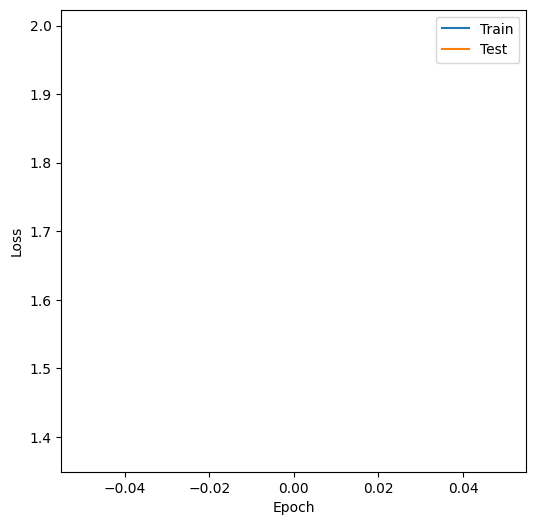


Ensemble model 16
Epoch 1/1 ... Training loss: 1.7207 ... Test loss: 1.3857 ... GPU memory usage: 4153/15360
Model (final state) evaluation loss: 1.3858
Plotting training history


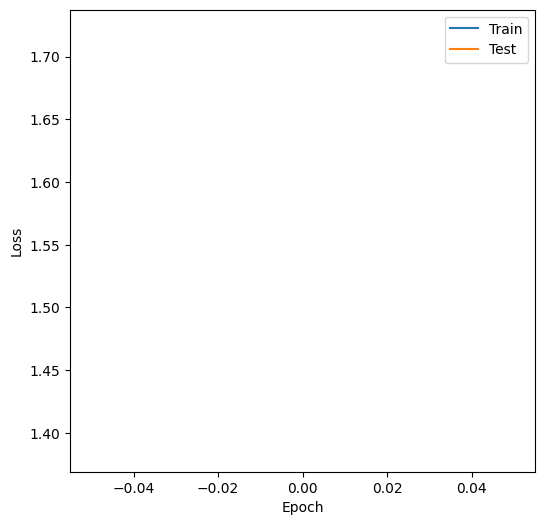


Ensemble model 17
Epoch 1/1 ... Training loss: 1.8663 ... Test loss: 1.347 ... GPU memory usage: 4199/15360
Model (final state) evaluation loss: 1.3467
Plotting training history


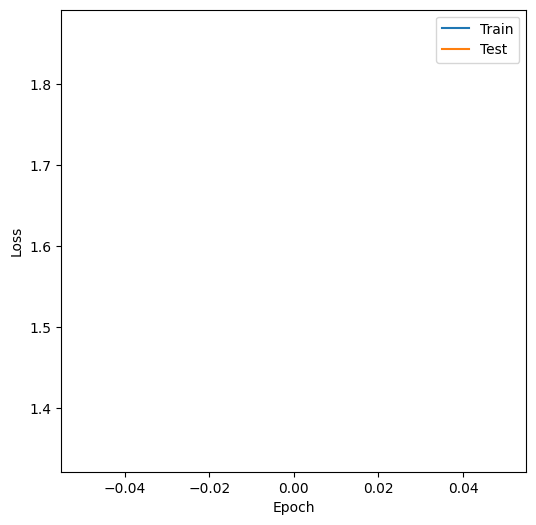


Ensemble model 18
Epoch 1/1 ... Training loss: 1.8388 ... Test loss: 1.3488 ... GPU memory usage: 4157/15360
Model (final state) evaluation loss: 1.3486
Plotting training history


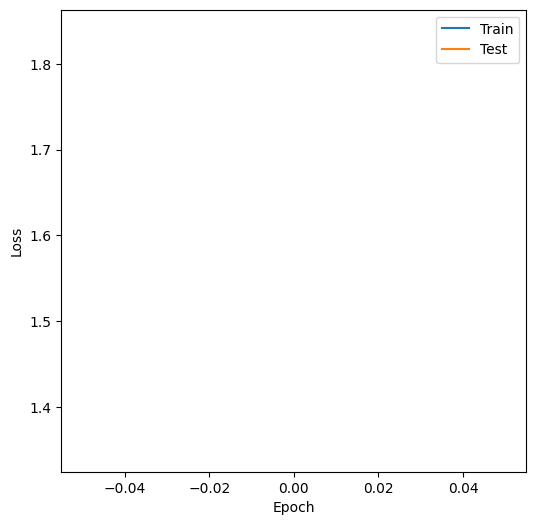


Ensemble model 19
Epoch 1/1 ... Training loss: 1.679 ... Test loss: 1.3819 ... GPU memory usage: 4203/15360
Model (final state) evaluation loss: 1.3819
Plotting training history


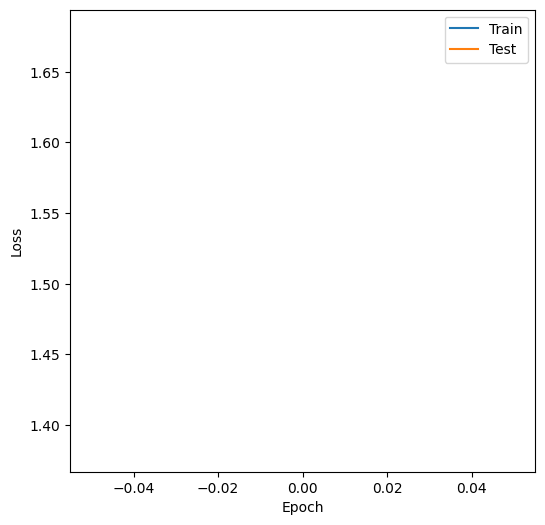


Ensemble model 20
Epoch 1/1 ... Training loss: 1.8966 ... Test loss: 1.3615 ... GPU memory usage: 4161/15360
Model (final state) evaluation loss: 1.3615
Plotting training history


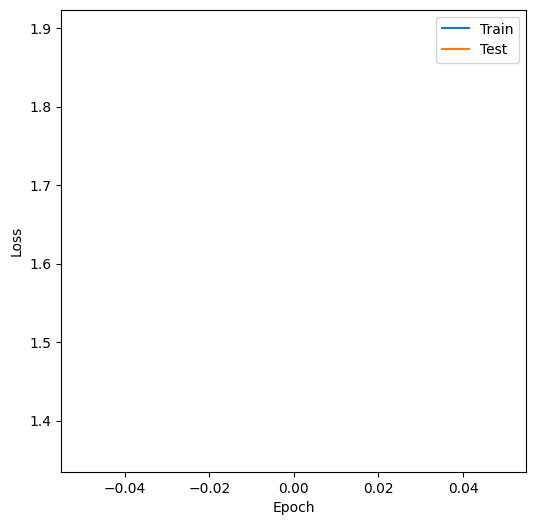

Downloading...
From: https://drive.google.com/uc?id=1VzUsnconpF3_QIIP-SEoVStwr7WubQTV
To: /content/ELIT_MoS2_GSTEM_v2_ensemble_metadict.tar
100% 48.3M/48.3M [00:00<00:00, 84.4MB/s]


In [21]:
train_new = False

if train_new:
  etrainer = aoi.trainers.EnsembleTrainer("Unet", nb_classes=1, with_dilation=False,
                                          batch_norm=True)

  etrainer.compile_ensemble_trainer(training_cycles=300, compute_accuracy=True, swa=True, memory_alloc=0.5, filename="new")

  smodel, ensemble = etrainer.train_ensemble_from_scratch(images_all_D, labels_all_D, n_models=8)

else:
  etrainer = aoi.trainers.EnsembleTrainer("Unet", nb_classes=4, with_dilation=False,
                                          batch_norm=True)

  etrainer.compile_ensemble_trainer(training_cycles=1)

  smodel, ensemble = etrainer.train_ensemble_from_scratch(gstem_train_img_all, gstem_train_labels_all, n_models=20, filename="/new_gstem")

  # Download model
  !gdown https://drive.google.com/uc?id=1VzUsnconpF3_QIIP-SEoVStwr7WubQTV

  # Load weights from the old model and put into the new ensemble format
  ensemble_old = torch.load("ELIT_MoS2_GSTEM_v2_ensemble_metadict.tar")["weights"]

  for i in range(len(ensemble)):
      ensemble[i] = ensemble_old[i]

  etrainer.save_ensemble_metadict()

  # load back the ensemble with new weigths:
  smodel, ensemble = aoi.models.load_ensemble("/new_gstem_ensemble_metadict.tar")

Downloading...
From (original): https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2
From (redirected): https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2&confirm=t&uuid=ffc13c0f-3312-4f1c-808f-659577a63cf6
To: /content/MoS2_Circle_3_gstem_rs.npy
100% 674M/674M [00:06<00:00, 104MB/s]


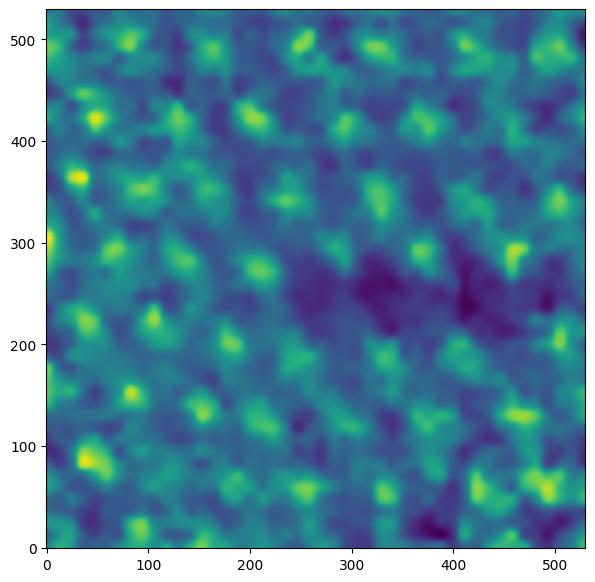

In [22]:
# Download experimental data
!gdown https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2

gstem_test_load = np.load('MoS2_Circle_3_gstem_rs.npy')

k = 131
exp_img = gstem_test_load[k]

plt.figure(figsize=(7, 7))
plt.imshow(exp_img, origin="lower")

Batch 1/1

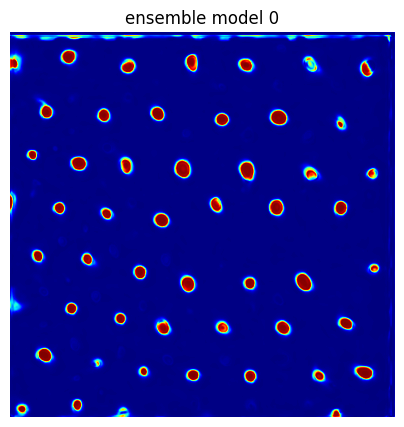

Batch 1/1

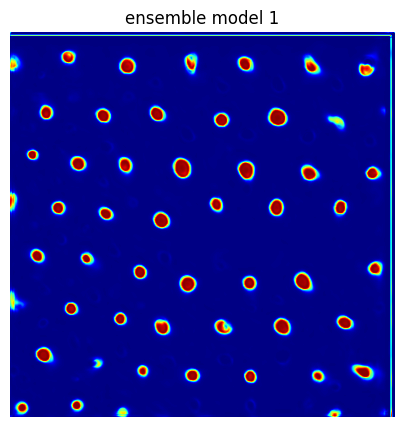

Batch 1/1

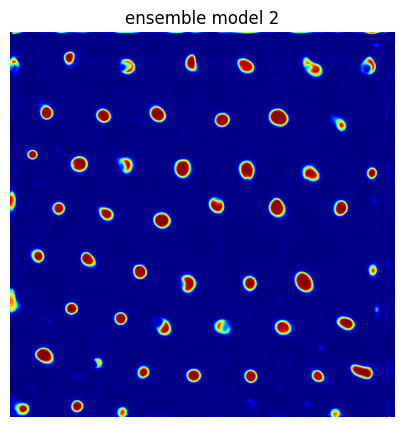

Batch 1/1

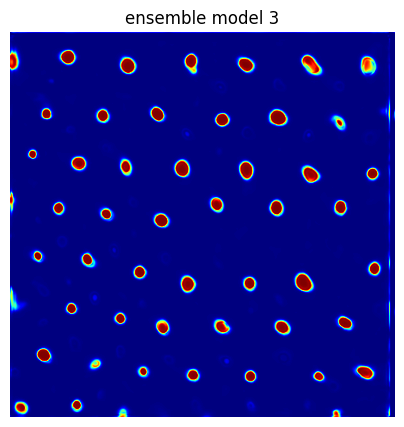

Batch 1/1

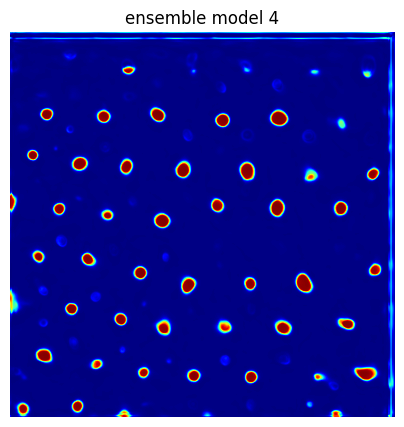

Batch 1/1

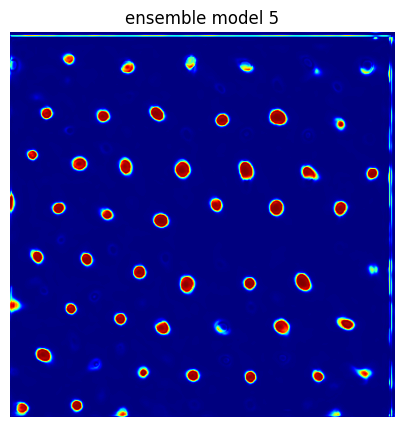

Batch 1/1

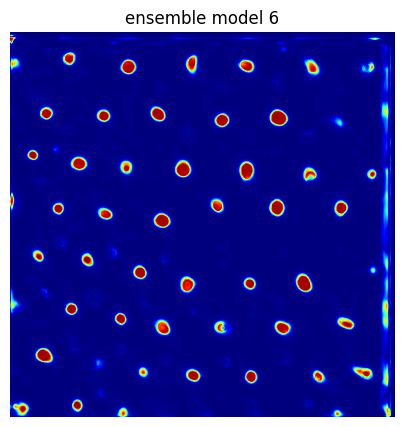

Batch 1/1

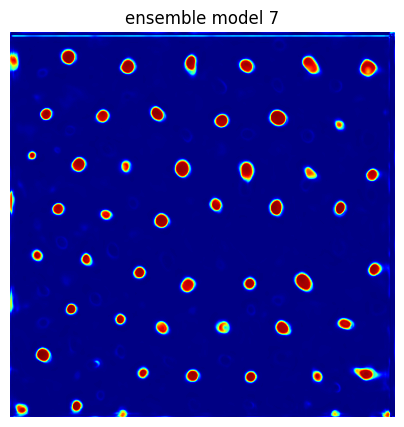

Batch 1/1

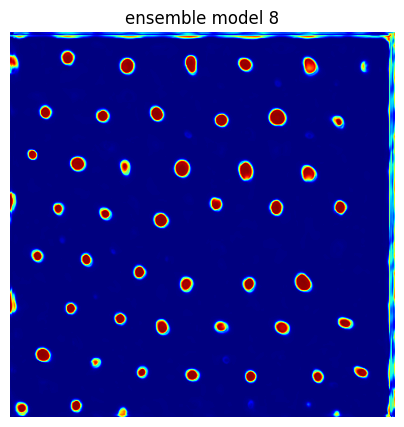

Batch 1/1

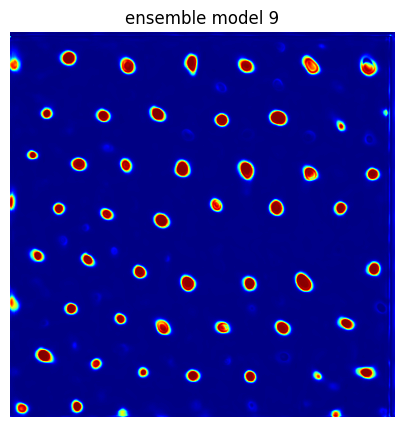

Batch 1/1

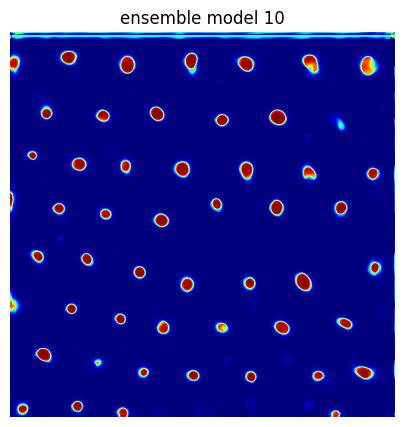

Batch 1/1

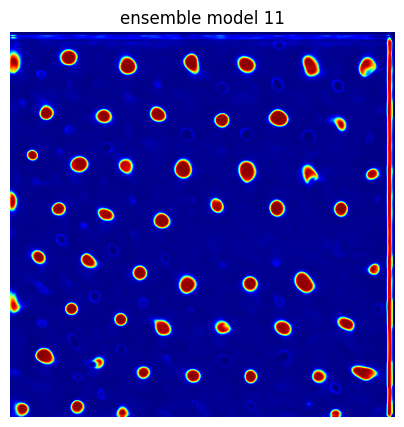

Batch 1/1

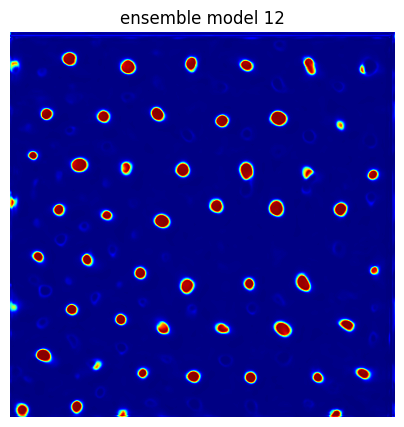

Batch 1/1

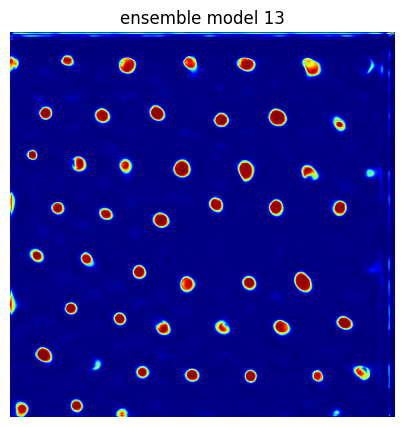

Batch 1/1

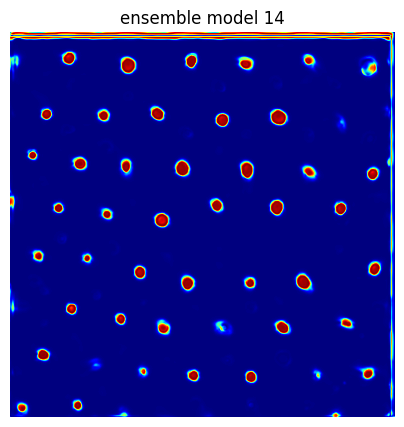

Batch 1/1

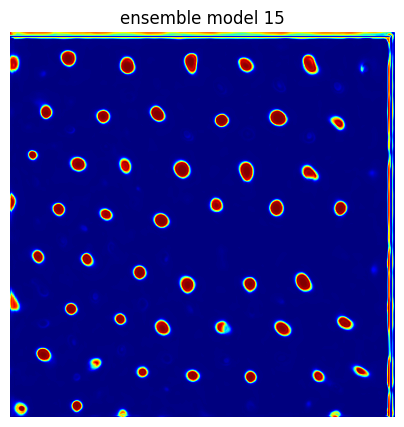

Batch 1/1

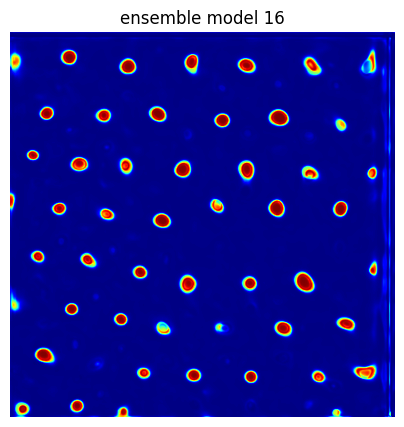

Batch 1/1

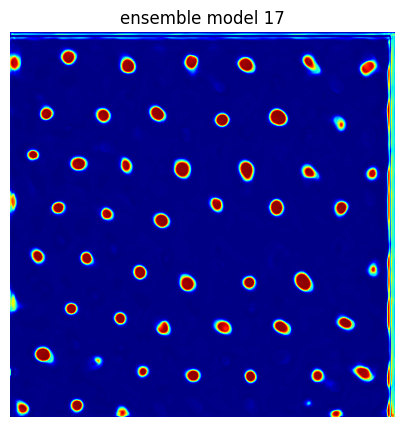

Batch 1/1

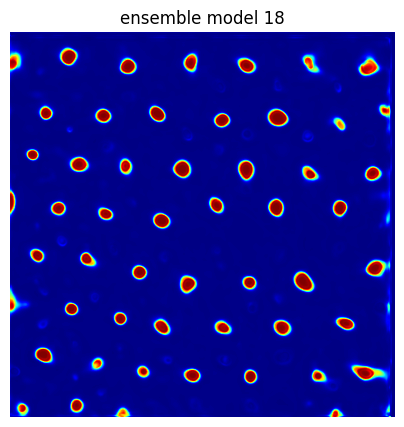

Batch 1/1

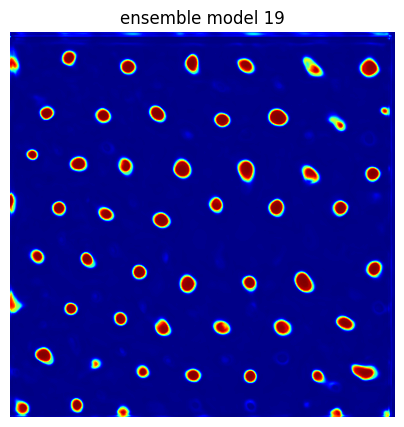

In [23]:
nn_out_all = np.zeros((len(ensemble),536,536,4))

for i, m in enumerate(ensemble.values()):
    smodel.load_state_dict(m)
    p = aoi.predictors.SegPredictor(smodel, use_gpu=True)
    nn_out = p.predict(exp_img)
    nn_out_all[i] = nn_out
    plt.figure(figsize=(5, 5))
    plt.imshow(nn_out[0, :, :, 0], origin="lower", cmap='jet', interpolation="Gaussian")
    plt.title("ensemble model {}".format(i))
    plt.axis('off')
    plt.show()

In [24]:
def variance_between_images(images):
  """
  Calculates the variance between a set of images.

  Args:
    images: A list of images.

  Returns:
    The variance between the images.
  """

  # Calculate the mean image.
  mean_image = np.mean(images, axis=0)

  # Calculate the squared difference between each image and the mean image.
  squared_differences = [(image - mean_image)**2 for image in images]

  # Calculate the sum of the squared differences.
  sum_of_squared_differences = np.sum(squared_differences, axis=0)
  # print(sum_of_squared_differences.shape)

  # Calculate the variance.
  # variance = np.mean(sum_of_squared_differences)
  variance = sum_of_squared_differences

  return variance


In [25]:
images_Mo = [
    nn_out_all[0,:,:,0],    nn_out_all[1,:,:,0],    nn_out_all[2,:,:,0],    nn_out_all[3,:,:,0],
    nn_out_all[4,:,:,0],    nn_out_all[5,:,:,0],    nn_out_all[6,:,:,0],    nn_out_all[7,:,:,0],
    nn_out_all[8,:,:,0],    nn_out_all[9,:,:,0],    nn_out_all[10,:,:,0],    nn_out_all[11,:,:,0],
    nn_out_all[12,:,:,0],    nn_out_all[13,:,:,0],    nn_out_all[14,:,:,0],    nn_out_all[15,:,:,0],
    nn_out_all[16,:,:,0],    nn_out_all[17,:,:,0],    nn_out_all[18,:,:,0],    nn_out_all[19,:,:,0],
]
mean_image_Mo = np.mean(images_Mo, axis=0)

variance_Mo = variance_between_images(images_Mo)

In [26]:
images_S2 = [
    nn_out_all[0,:,:,1],    nn_out_all[1,:,:,1],    nn_out_all[2,:,:,1],    nn_out_all[3,:,:,1],
    nn_out_all[4,:,:,1],    nn_out_all[5,:,:,1],    nn_out_all[6,:,:,1],    nn_out_all[7,:,:,1],
    nn_out_all[8,:,:,1],    nn_out_all[9,:,:,1],    nn_out_all[10,:,:,1],    nn_out_all[11,:,:,1],
    nn_out_all[12,:,:,1],    nn_out_all[13,:,:,1],    nn_out_all[14,:,:,1],    nn_out_all[15,:,:,1],
    nn_out_all[16,:,:,1],    nn_out_all[17,:,:,1],    nn_out_all[18,:,:,1],    nn_out_all[19,:,:,1],
]
mean_image_S2 = np.mean(images_S2, axis=0)
variance_S2 = variance_between_images(images_S2)

In [27]:
images_S1 = [
    nn_out_all[0,:,:,2],    nn_out_all[1,:,:,2],    nn_out_all[2,:,:,2],    nn_out_all[3,:,:,2],
    nn_out_all[4,:,:,2],    nn_out_all[5,:,:,2],    nn_out_all[6,:,:,2],    nn_out_all[7,:,:,2],
    nn_out_all[8,:,:,2],    nn_out_all[9,:,:,2],    nn_out_all[10,:,:,2],    nn_out_all[11,:,:,2],
    nn_out_all[12,:,:,2],    nn_out_all[13,:,:,2],    nn_out_all[14,:,:,2],    nn_out_all[15,:,:,2],
    nn_out_all[16,:,:,2],    nn_out_all[17,:,:,2],    nn_out_all[18,:,:,2],    nn_out_all[19,:,:,2],
]
mean_image_S1 = np.mean(images_S1, axis=0)
variance_S1 = variance_between_images(images_S1)

Text(0.5, 1.0, 'S1 Variance')

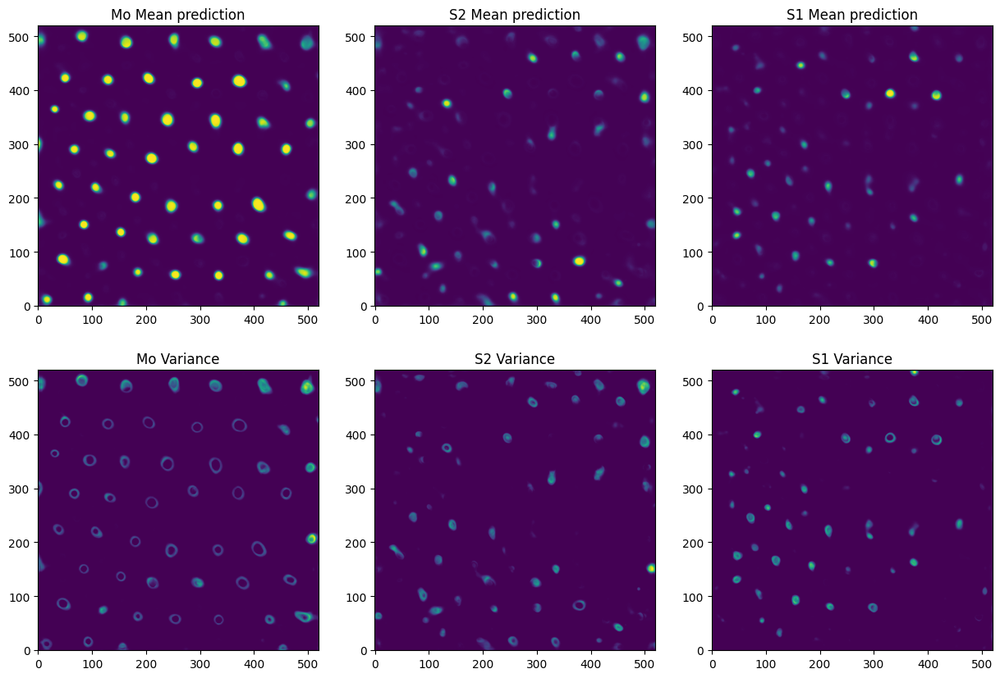

In [28]:
fig, ax = plt.subplots(2, 3, figsize=(15, 10))
ax[0,0].imshow(mean_image_Mo[0:520,0:520], origin="lower")
ax[0,0].set_title("Mo Mean prediction")
ax[0,1].imshow(mean_image_S2[0:520,0:520], origin="lower")
ax[0,1].set_title("S2 Mean prediction")
ax[0,2].imshow(mean_image_S1[0:520,0:520], origin="lower")
ax[0,2].set_title("S1 Mean prediction")
ax[1,0].imshow(variance_Mo[0:520,0:520], origin="lower")
ax[1,0].set_title("Mo Variance")
ax[1,1].imshow(variance_S2[0:520,0:520], origin="lower")
ax[1,1].set_title("S2 Variance")
ax[1,2].imshow(variance_S1[0:520,0:520], origin="lower")
ax[1,2].set_title("S1 Variance")

Text(0.5, 1.0, 'Variance')

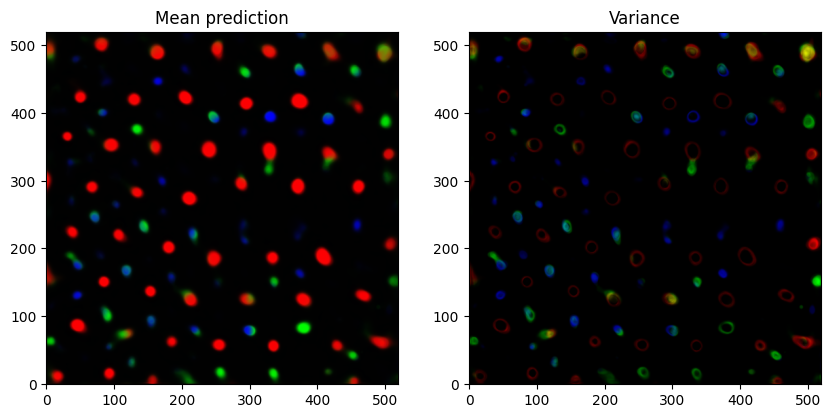

In [29]:
mean_image_all = np.stack((mean_image_Mo, mean_image_S2, mean_image_S1), axis=2)
variance_all = np.stack((variance_Mo, variance_S2, variance_S1), axis=2)

from matplotlib.colors import ListedColormap
cmap1 = ListedColormap(['red', 'green', 'yellow'])

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(normalize(mean_image_all[0:520,0:520,:]), cmap=cmap1, origin="lower")
ax[0].set_title("Mean prediction")
ax[1].imshow(normalize(variance_all[0:520,0:520,:]), cmap=cmap1, origin="lower")
ax[1].set_title("Variance")

In [30]:
smodel.load_state_dict(ensemble[5])
dataset = gstem_test_load[:,15:515,15:515]
decoded, coord = aoi.predictors.SegPredictor(smodel, use_gpu=True, thresh=0.8).run(dataset)

Batch 300/300
300 images were decoded in approximately 15.5552 seconds


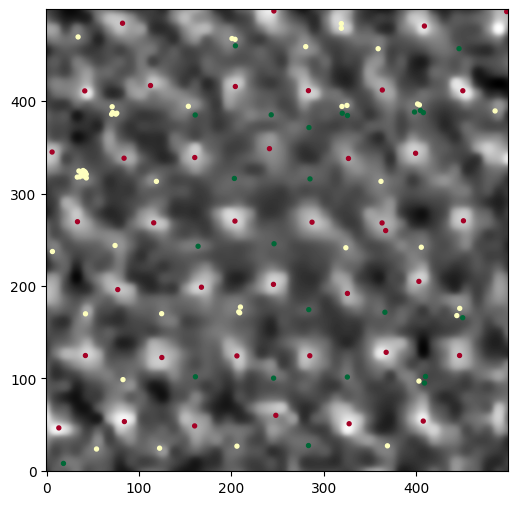

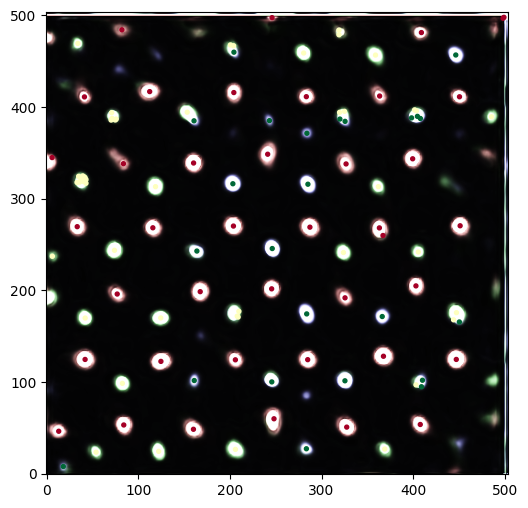

In [31]:
aoi.utils.plot_coord(dataset[0,:,:], coord[0], fsize=6)
aoi.utils.plot_coord(decoded[0,:,:,:], coord[0], fsize=6)

# Nearest Neighbor Filtering

### Initial Setup

In [6]:
# Download experimental data
!gdown https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2
!gdown https://drive.google.com/uc?id=1Br0d0Z3UZ_zzW3HjLJ8xoWFRx6yuRTpa
!gdown https://drive.google.com/uc?id=1qpm1-51dEhkQ3woOpnr9jQIrLWCxd3Ux

file_name = 'MoS2_Circle_3_gstem_rs'
gstem_test_load = np.load(file_name+'.npy')
dataset = gstem_test_load[:,10:520,10:520]

gstem_test_decoded = np.load(file_name+'_decoded.npy')

gstem_coord_dict = np.load(file_name+'_coords_unfiltered.npz', allow_pickle=True)
gstem_coord = gstem_coord_dict['gstem_coord'].tolist()

Downloading...
From (original): https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2
From (redirected): https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2&confirm=t&uuid=2f12013e-7acb-473a-b20c-7e6ca50f11aa
To: /content/MoS2_Circle_3_gstem_rs.npy
100% 674M/674M [00:02<00:00, 325MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1Br0d0Z3UZ_zzW3HjLJ8xoWFRx6yuRTpa
From (redirected): https://drive.google.com/uc?id=1Br0d0Z3UZ_zzW3HjLJ8xoWFRx6yuRTpa&confirm=t&uuid=2f463e0e-0346-426d-9bd1-7a65a9e4eb58
To: /content/MoS2_Circle_3_gstem_rs_decoded.npy
100% 1.26G/1.26G [00:03<00:00, 345MB/s]
Downloading...
From: https://drive.google.com/uc?id=1qpm1-51dEhkQ3woOpnr9jQIrLWCxd3Ux
To: /content/MoS2_Circle_3_gstem_rs_coords_unfiltered.npz
100% 596k/596k [00:00<00:00, 137MB/s]


Start of Frame Inspection

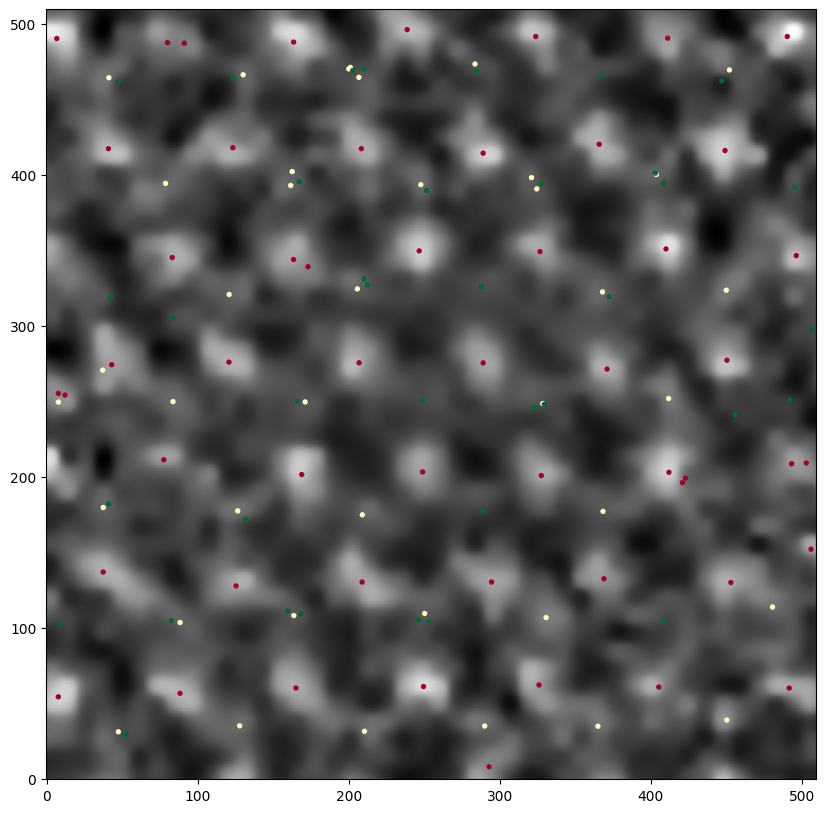

In [7]:
#Frame select
k=1

# Plot frame decoded and overlaid coordinates
aoi.utils.plot_coord(dataset[k], gstem_coord[k], fsize=10)

1
frame = 1  :  NND = 27.997023938077977
129
90


(-0.968585371122112, 51.452991165772445)

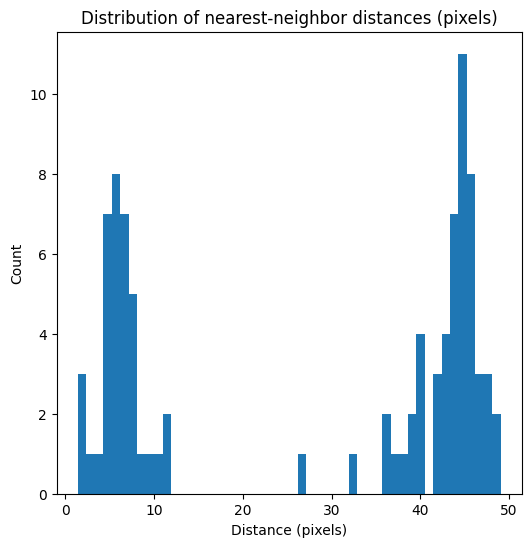

In [8]:
print(k)
distances_all = []
checked_coord = []

for i1, c in enumerate(gstem_coord[k]):
    d, i2 = spatial.cKDTree(gstem_coord[k]).query(c, k=2)
    if tuple((i2[-1], i1)) not in checked_coord:
      distances_all.append(d[-1])
      checked_coord.append(tuple((i1, i2[-1])))

nnd_aver = np.mean(distances_all)
print('frame = '+str(k)+'  :  NND = '+str(nnd_aver))
print(len(gstem_coord[k]))
# distances_all
print(len(checked_coord))

fig, ax = plt.subplots(1, 1, figsize=(6,6))
_ = ax.hist(distances_all, bins=50)
ax.set_title('Distribution of nearest-neighbor distances (pixels)')
ax.set_xlabel('Distance (pixels)')
ax.set_ylabel('Count');
nndxlim1, nndxlim2 = ax.get_xlim()
nndxlim1, nndxlim2

In [9]:
#Function to find the problem with initial ckDTree

def NND_Initial_Filter(frame):
  DCNN_corr_coord = []
  bad_coords = []

  for i1, c in enumerate(frame): # frame = gstem_coord[k][:,:3]
    d, i2 = spatial.cKDTree(frame).query(c, k=2)
    if d[-1] > 20:
      DCNN_corr_coord.append(c)
    elif d[-1] < 20:
      bad_coords.append(c)

  DCNN_corr_coord = np.array(DCNN_corr_coord)
  bad_coords = np.array(bad_coords)

  return DCNN_corr_coord, bad_coords

In [10]:
coords_corr, cluster_coord = NND_Initial_Filter(gstem_coord[k])
print(coords_corr.shape)
print(cluster_coord.shape)
print(gstem_coord[k].shape)

(67, 3)
(62, 3)
(129, 3)


1


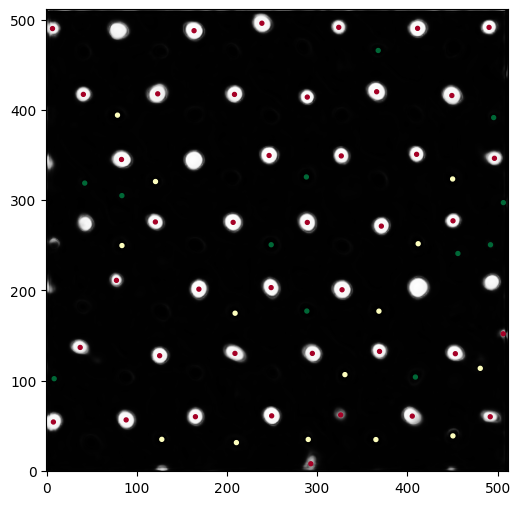

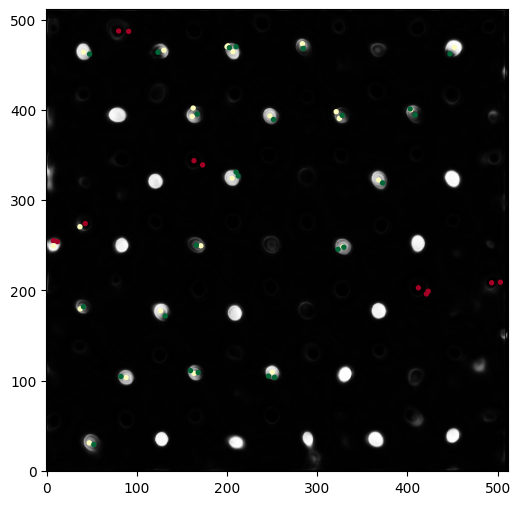

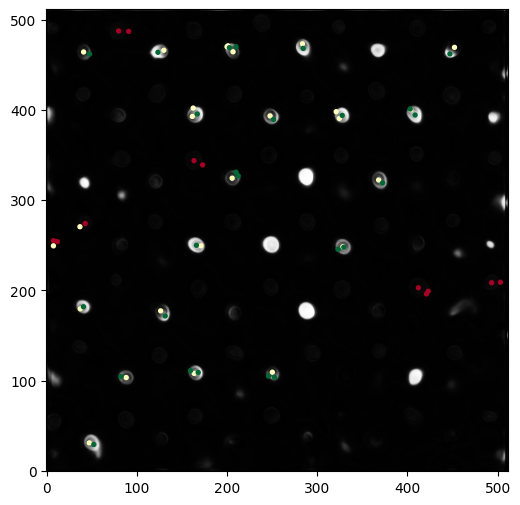

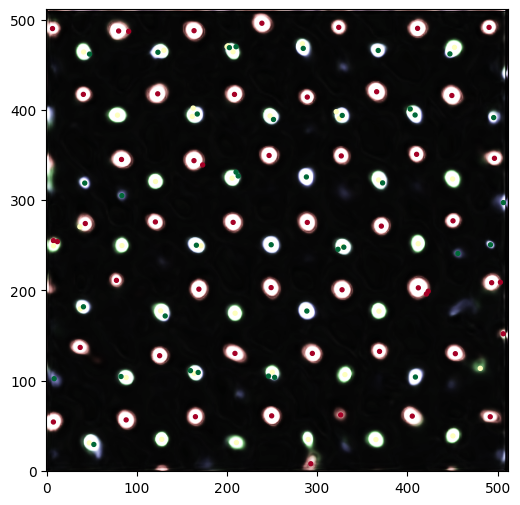

In [11]:
# Plot split of good DCNN coords and the problem locations over different decoded images
print(k)
c=2
aoi.utils.plot_coord(gstem_test_decoded[k,...,0], coords_corr, fsize=6) # Mo
aoi.utils.plot_coord(gstem_test_decoded[k,...,1], cluster_coord, fsize=6) # S2
aoi.utils.plot_coord(gstem_test_decoded[k,...,2], cluster_coord, fsize=6) # S1
aoi.utils.plot_coord(gstem_test_decoded[k,...,:], gstem_coord[k], fsize=6) # All

(0.0, 0.6)

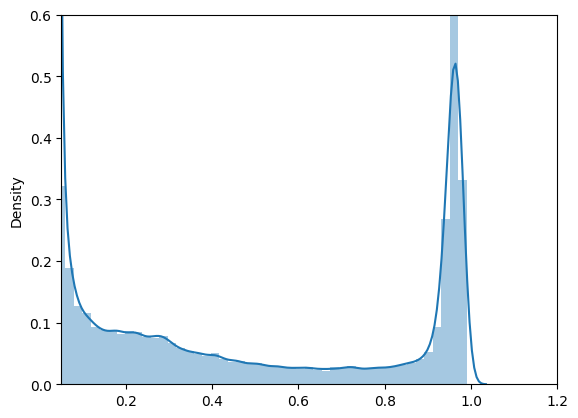

In [12]:
sns.distplot(gstem_test_decoded[k,...,0])
plt.xlim(0.05, 1.2)
plt.ylim(0,0.6)

### Atom Finding of Masks for Filter Refine


In [13]:
def Atom_Finding(decoded_class, threshold, dist):
  model = st.afit.atom_fit(decoded_class, 1, 'nm') #not really nm but pixels
  model.define_reference((0,0), (0,len(decoded_class)), (len(decoded_class),len(decoded_class)), (len(decoded_class),0), (6,6), tColor='g')     # remove print and plot
  model.peaks_vis(dist, threshold, 1, (6,6),'c')                                    # remove plot
  atf_refined_peaks = model.peaks[:,:2]
  return atf_refined_peaks

Mo atom finding fo the Mo mask model to use for filter

In [14]:
Mo_thresh = 0.5
Mo_dist = 20
Mo_refined_peaks = Atom_Finding(gstem_test_decoded[k,...,0], Mo_thresh, Mo_dist)

S2 atom finding fo the S2 mask model to use for filter

In [15]:
S2_thresh = 0.7
S2_dist = 20
S2_refined_peaks = Atom_Finding(gstem_test_decoded[k,...,1], S2_thresh, S2_dist)

S1 atom finding for the S1 mask model to use for filter

In [16]:
S1_thresh = 0.5
S1_dist = 15
S1_refined_peaks = Atom_Finding(gstem_test_decoded[k,...,2], S1_thresh, S1_dist)

Combine atom finding lists for filter

In [17]:
zero = np.full((1,1), 0)
one = np.full((1,1), 1)
two = np.full((1,1), 2)

In [18]:
Mo_frpos_class = np.insert(Mo_refined_peaks, 2, zero, axis=1)
S2_frpos_class = np.insert(S2_refined_peaks, 2, one, axis=1)
S1_frpos_class = np.insert(S1_refined_peaks, 2, two, axis=1)

In [19]:
coord_atf = np.concatenate((Mo_frpos_class, S2_frpos_class, S1_frpos_class), axis=0)

### Filter refinement

In [20]:
def Initial_DCNN_ATMF_Refine(dcnn_coords, atf_coords):
# #loop through cluster_coords and coord_atf - attempt to remove entries from the array that have already been indexed appropriately with dcnn
  i = 0
  j = 0

  dcnn_atf_coords = []

  for i in range(len(dcnn_coords)):
    for j in range(len(atf_coords)):
      dist = math.sqrt((atf_coords[j,1]-dcnn_coords[i,1])**2 + (atf_coords[j,0]-dcnn_coords[i,0])**2)
      if dist <= 20:
        dcnn_atf_coords.append(atf_coords[j])
      j += 1
    i += 1

  dcnn_atf_coords = np.array(dcnn_atf_coords)
  dcnn_atf_coords = np.unique(dcnn_atf_coords, axis=0)
  return dcnn_atf_coords

In [21]:
cluster_coord_atf_rf = Initial_DCNN_ATMF_Refine(cluster_coord, coord_atf)

In [22]:
def Find_Duplicate_Sites(dcnn_atf_coords):
  ## Loops to find the problem children and refines clustered atoms positions
  corr_coords = []
  problem_indices = []

  for i1, c in enumerate(dcnn_atf_coords):
    d, i2 = spatial.cKDTree(dcnn_atf_coords).query(c, k=2)
    if d[-1] >= 20:
      corr_coords.append(c)
    elif d[-1] < 20:
      corr_coords.append(c)
      problem_indices.append(i1)

  corr_coords = np.array(corr_coords)
  return corr_coords, problem_indices

In [23]:
S_coords, bad = Find_Duplicate_Sites(cluster_coord_atf_rf)

In [24]:
def Find_Duplicate_Error(corr_coords, problem_indices):
  ind =[]
  dist_check = []

  for i in range(len(problem_indices)):
    for j in range(len(problem_indices)):
      dist_c = math.sqrt((corr_coords[problem_indices[j],1]-corr_coords[problem_indices[i],1])**2 + (corr_coords[problem_indices[j],0]-corr_coords[problem_indices[i],0])**2)
      if dist_c > 20.:
        pass
      elif dist_c == 0.:
        pass
      elif dist_c > 0. and dist_c <= 20. :
        if corr_coords[problem_indices[i],2] <= corr_coords[problem_indices[j],2] :
          if problem_indices[j] not in ind and dist_c not in dist_check:
            ind.append(problem_indices[j])
            dist_check.append(dist_c)
  ind=np.array(ind)
  return ind

In [25]:
ind = Find_Duplicate_Error(S_coords, bad)
if len(bad) == 0. :
  S_coords_del = S_coords
elif len(bad) != 0. :
  S_coords_del = np.delete(S_coords,ind,axis=0)

In [26]:
if len(S_coords_del) != 0:
  coord_filtered = np.concatenate((coords_corr, S_coords_del), axis=0)
else:
  coord_filtered = coords_corr

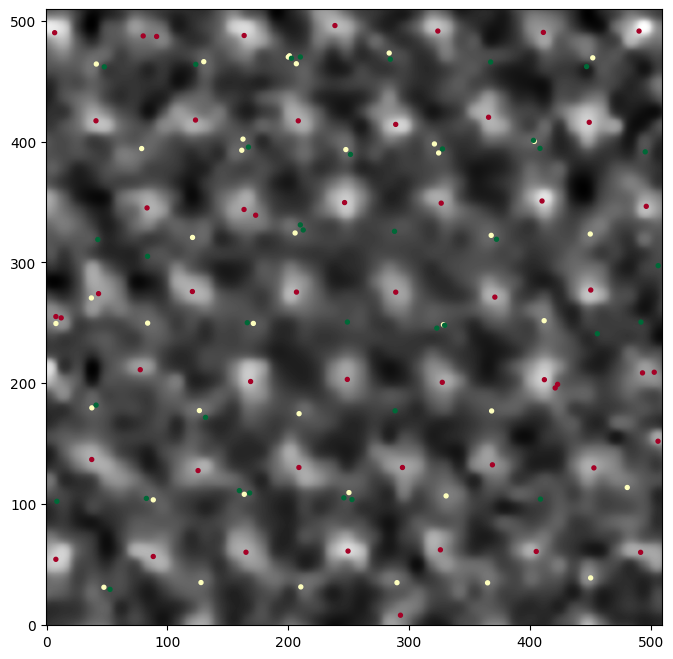

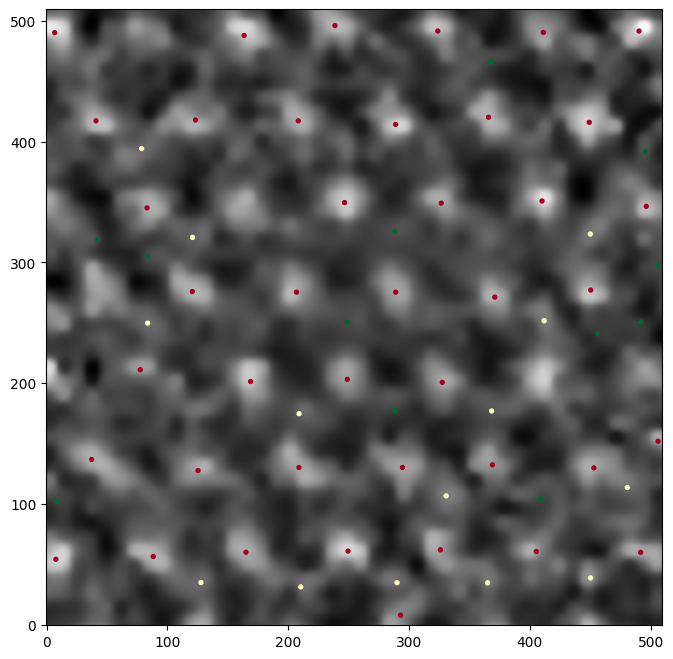

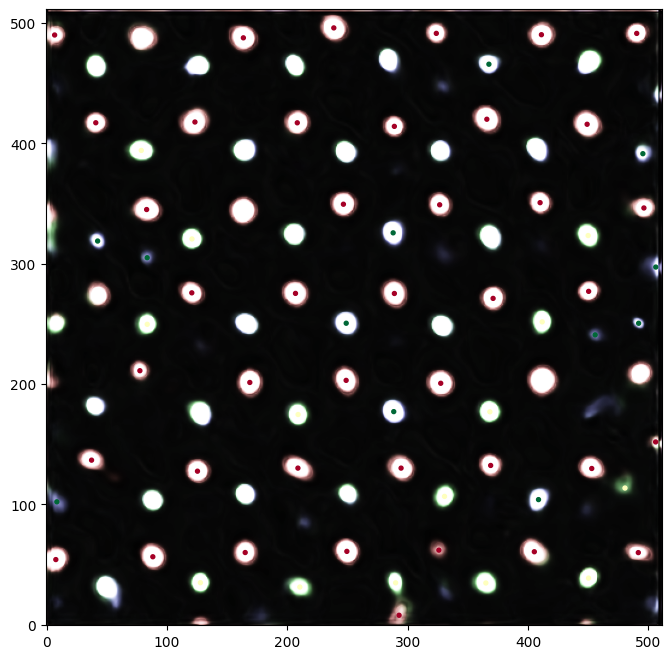

In [27]:
# Plot results
# Compare to unfiltered
aoi.utils.plot_coord(dataset[k], gstem_coord[k], fsize=8)
#Plot the filtered results
aoi.utils.plot_coord(dataset[k], coord_filtered, fsize=8)
aoi.utils.plot_coord(gstem_test_decoded[k,...,:], coord_filtered, fsize=8)


# Tracking Atoms

In [25]:
# Download fully decoded dataset
!gdown https://drive.google.com/uc?id=1xIZ3sBt-6f8xlm13UHE0BGU0Kk0Y8xkD

decoded = np.load('decoded_img_gstem_C3.npy')

Downloading...
From (original): https://drive.google.com/uc?id=1xIZ3sBt-6f8xlm13UHE0BGU0Kk0Y8xkD
From (redirected): https://drive.google.com/uc?id=1xIZ3sBt-6f8xlm13UHE0BGU0Kk0Y8xkD&confirm=t&uuid=00c8247a-d569-4fcd-ab09-c1cef5dc388e
To: /content/decoded_img_gstem_C3.npy
100% 591M/591M [00:09<00:00, 64.9MB/s]


In [26]:
# Download the filtered coordinates
!gdown https://drive.google.com/uc?id=1UXq1V-QCS2acwPfAFUN8Xg0LwI7zijNu

test = np.load('coordinates_filtered_gstem_C3.npz', allow_pickle=True)

Downloading...
From: https://drive.google.com/uc?id=1UXq1V-QCS2acwPfAFUN8Xg0LwI7zijNu
To: /content/coordinates_filtered_gstem_C3.npz
100% 317k/317k [00:00<00:00, 103MB/s]


In [27]:
coord_dict = test['dataset_coords_filtered'].tolist()

Downloading...
From (original): https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2
From (redirected): https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2&confirm=t&uuid=e122faaf-2491-46cd-8710-4f0117ea63b4
To: /content/MoS2_Circle_3_gstem_rs.npy
100% 674M/674M [00:02<00:00, 281MB/s]
141
(142, 530, 530)


(530, 530)

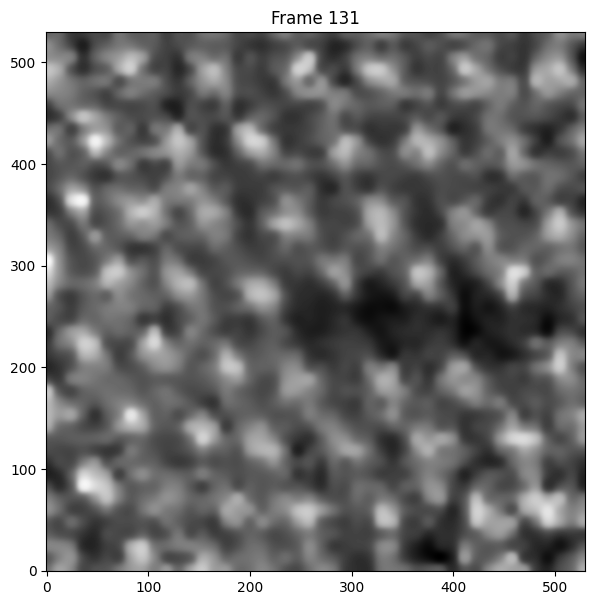

In [31]:
# Download experimental data
!gdown https://drive.google.com/uc?id=1RlE7J93kAKbwxN0gQ3J1fX3FoajK7tK2

exp_img = np.load('MoS2_Circle_3_gstem_rs.npy')

k3 = 131

k4 = len(decoded)
print(k4)
exp_img_data = exp_img[:k4+1]
print(exp_img_data.shape)

fig, ax = plt.subplots(1, 1, figsize=(7, 7))
ax.imshow(exp_img_data[k3], cmap='gray', origin="lower")
ax.set_title("Frame {}".format(k3))

exp_img_data[k4].shape

(510, 510)

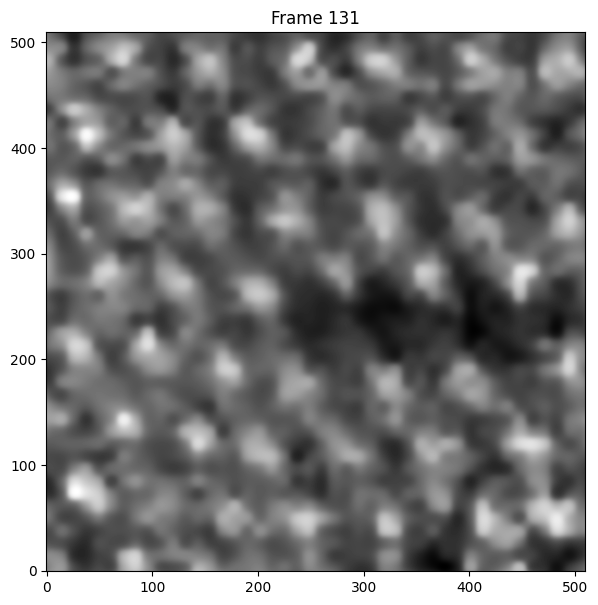

In [34]:
img = np.load('MoS2_Circle_3_gstem_rs.npy')

img_data = img[:k4+1,10:520,10:520]

fig, ax = plt.subplots(1, 1, figsize=(7, 7))
ax.imshow(img_data[k3], cmap='gray', origin="lower")
ax.set_title("Frame {}".format(k3))

img_data[k4].shape

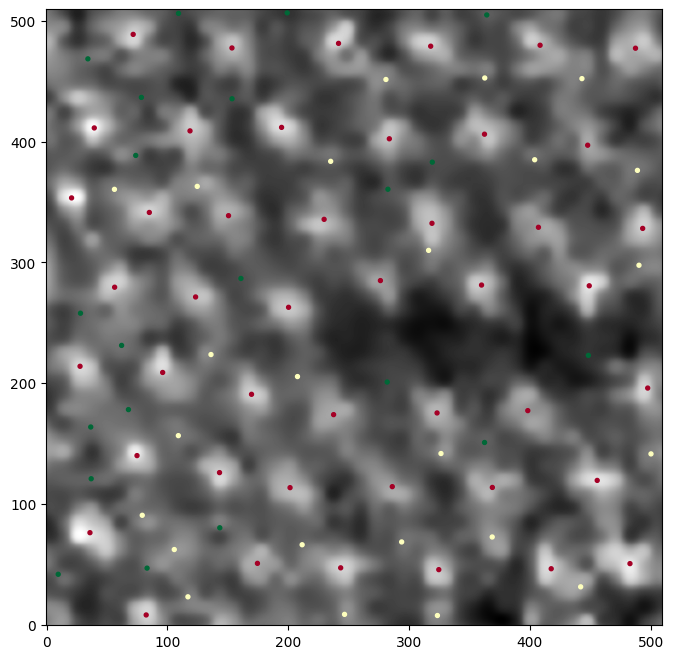

In [35]:
aoi.utils.plot_coord(img_data[k3], coord_dict[k3], fsize=8)

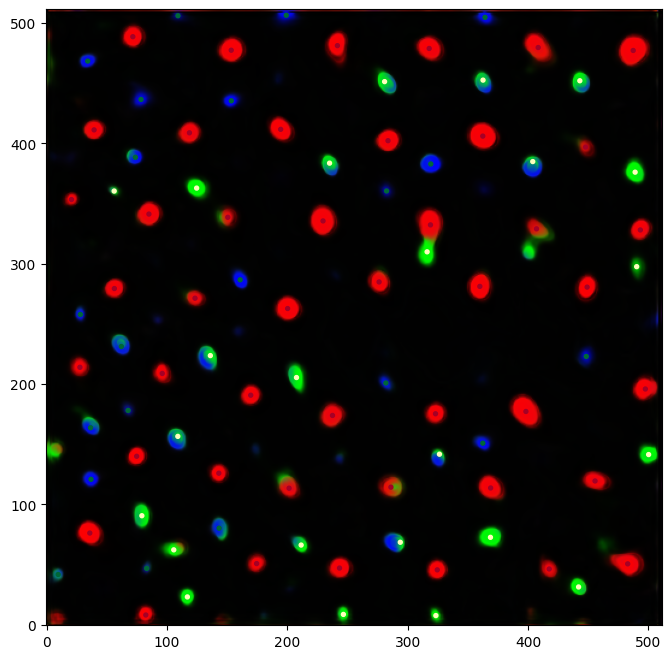

In [36]:
aoi.utils.plot_coord(decoded[k3,...,:3], coord_dict[k3], fsize=8)

### Track all

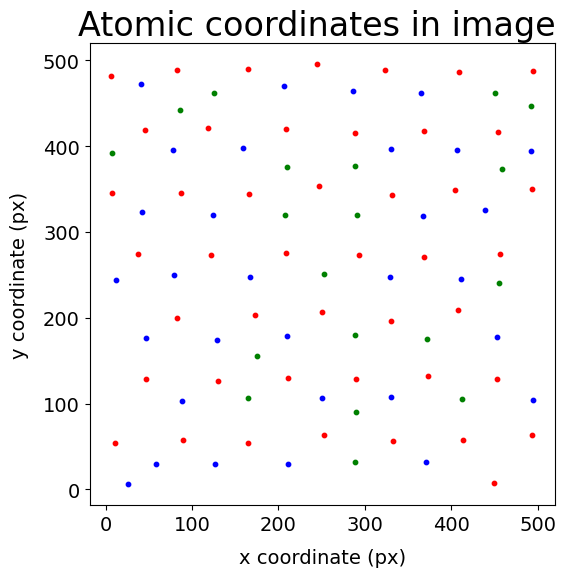

In [37]:
k=0

fig = plt.figure(figsize = (6, 6))
ax = fig.add_subplot(111)
ax.set_xlabel('x coordinate (px)', fontsize=14)
ax.set_ylabel('y coordinate (px)', fontsize=14)
ax.xaxis.labelpad = 10
ax.yaxis.labelpad = 10
ax.set_title('Atomic coordinates in image ', fontsize=24)
ax.dist = 10 # use it to zoom in/out
ax.tick_params(labelsize=14)

for m in range(len(coord_dict[k])):
  if coord_dict[k][m][2] == 0:
    ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], c='r', s=10)
  elif coord_dict[k][m][2] == 1:
    ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], c='b', s=10)
  if coord_dict[k][m][2] == 2:
    ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], c='g', s=10)

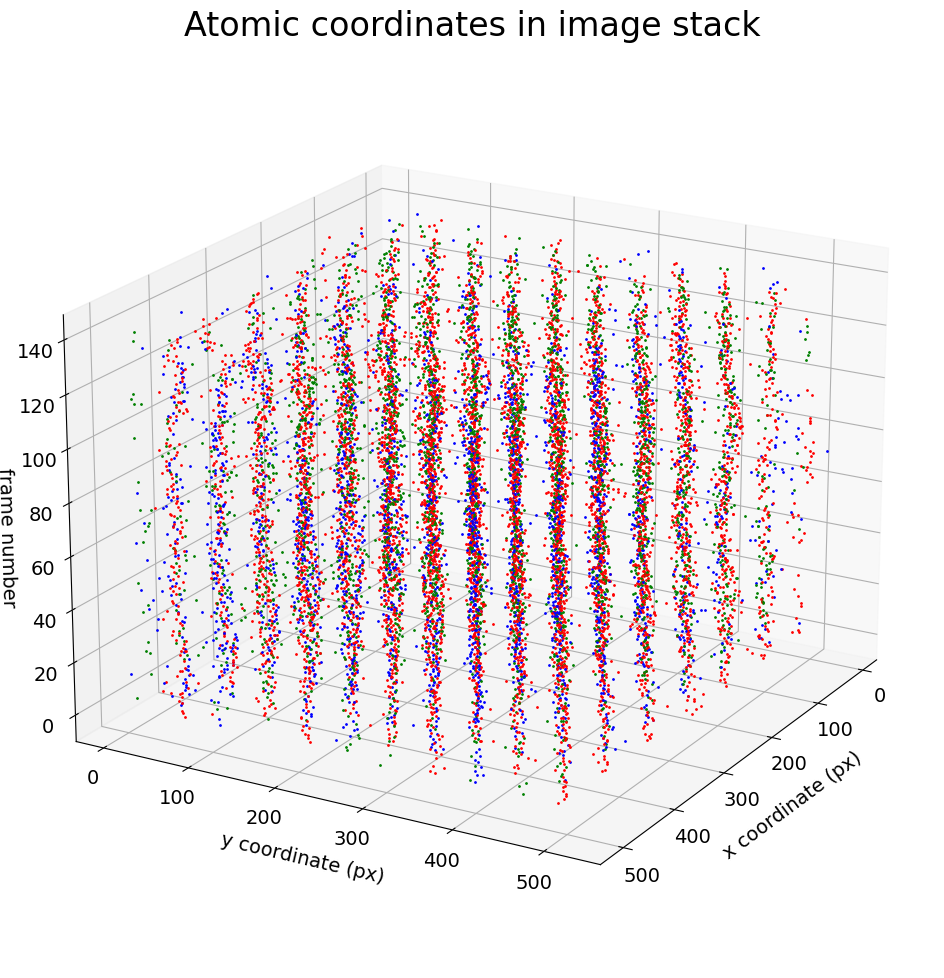

In [38]:
fig = plt.figure(figsize = (12, 12))
ax = fig.add_subplot(111, projection = '3d')
ax.view_init(20, 30)
ax.set_xlabel('x coordinate (px)', fontsize=14)
ax.set_ylabel('y coordinate (px)', fontsize=14)
ax.set_zlabel('frame number', fontsize=14)
ax.xaxis.labelpad = 10
ax.yaxis.labelpad = 10
ax.zaxis.labelpad = 5
ax.set_title('Atomic coordinates in image stack', fontsize=24)
ax.dist = 10 # use it to zoom in/out
ax.tick_params(labelsize=14)

for k in range(k4-1):
  for m in range(len(coord_dict[k])):
    if coord_dict[k][m][2] == 0.0:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='r', s=1)
    elif coord_dict[k][m][2] == 1.0:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='b', s=1)
    elif coord_dict[k][m][2] == 2.0:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='g', s=1)

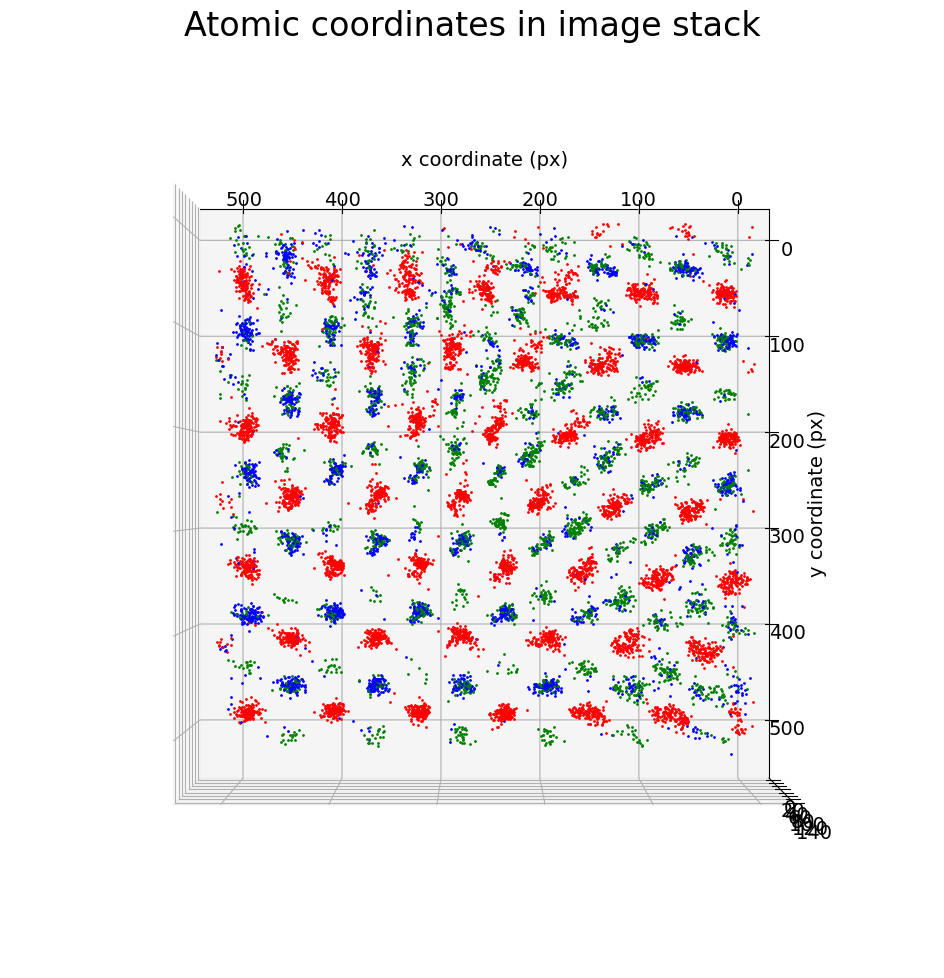

In [39]:
fig = plt.figure(figsize = (12, 12))
ax = fig.add_subplot(111, projection = '3d')
ax.view_init(90, 90)
ax.set_xlabel('x coordinate (px)', fontsize=14)
ax.set_ylabel('y coordinate (px)', fontsize=14)
ax.xaxis.labelpad = 10
ax.yaxis.labelpad = 10
ax.set_title('Atomic coordinates in image stack', fontsize=24)
ax.dist = 10 # use it to zoom in/out
ax.tick_params(labelsize=14)

for k in range(k4-1):
  for m in range(len(coord_dict[k])):
    if coord_dict[k][m][2] == 0:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='r', s=1)
    elif coord_dict[k][m][2] == 1:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='b', s=1)
    elif coord_dict[k][m][2] == 2:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='g', s=1)

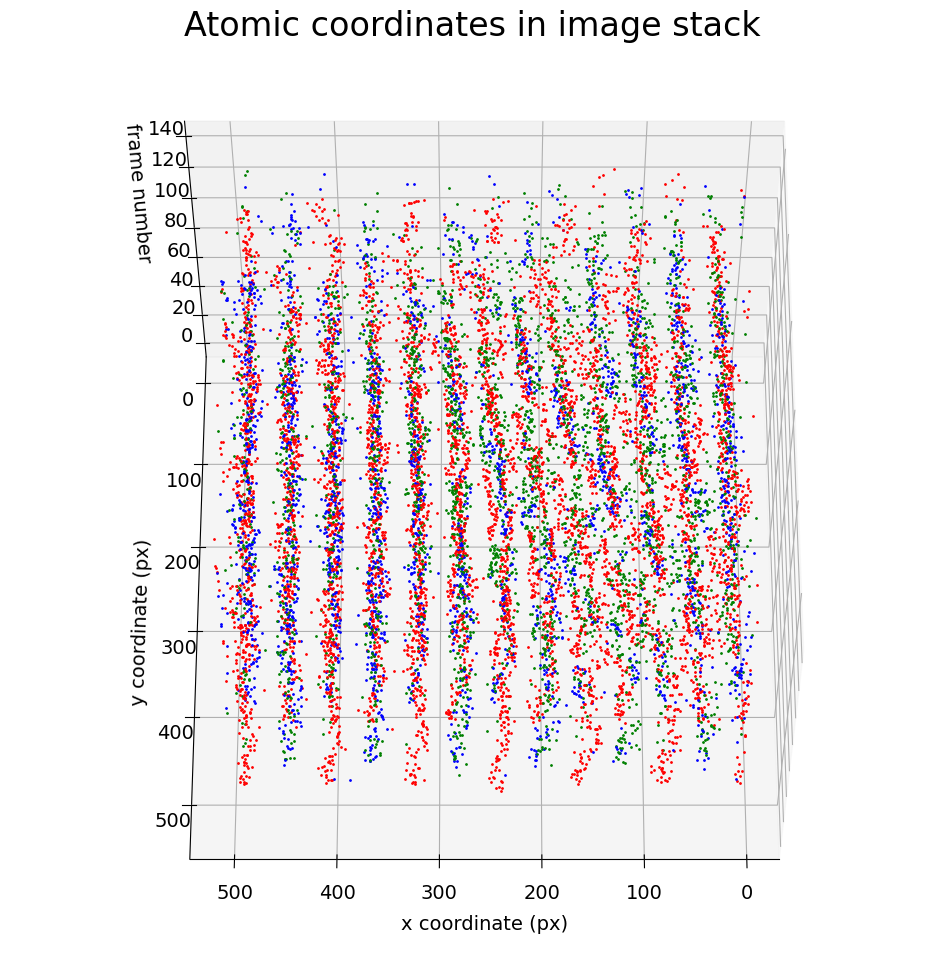

In [40]:
fig = plt.figure(figsize = (12, 12))
ax = fig.add_subplot(111, projection = '3d')
ax.view_init(60, 90)
ax.set_xlabel('x coordinate (px)', fontsize=14)
ax.set_ylabel('y coordinate (px)', fontsize=14)
ax.set_zlabel('frame number', fontsize=14)
ax.xaxis.labelpad = 10
ax.yaxis.labelpad = 15
ax.zaxis.labelpad = 15
ax.set_title('Atomic coordinates in image stack', fontsize=24)
ax.dist = 10 # use it to zoom in/out
ax.tick_params(labelsize=14)

for k in range(k4-1):
  for m in range(len(coord_dict[k])):
    if coord_dict[k][m][2] == 0:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='r', s=1)
    elif coord_dict[k][m][2] == 1:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='b', s=1)
    elif coord_dict[k][m][2] == 2:
      ax.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='g', s=1)

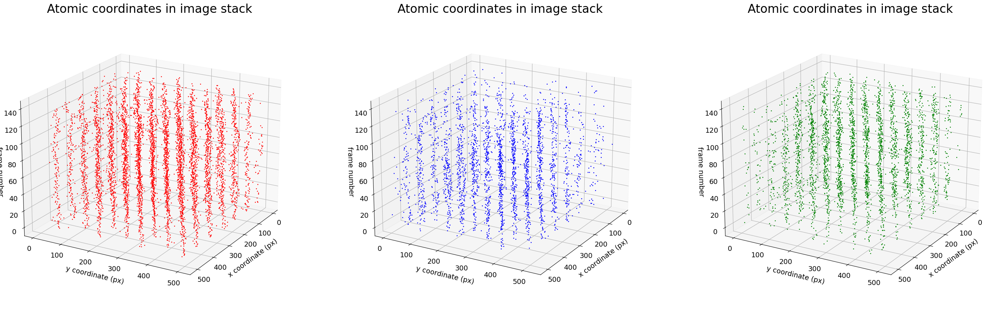

In [41]:
fig = plt.figure(figsize = (36, 12))
ax1 = fig.add_subplot(131, projection = '3d')
ax1.view_init(20, 30)
ax1.set_xlabel('x coordinate (px)', fontsize=14)
ax1.set_ylabel('y coordinate (px)', fontsize=14)
ax1.set_zlabel('frame number', fontsize=14)
ax1.xaxis.labelpad = 10
ax1.yaxis.labelpad = 10
ax1.zaxis.labelpad = 5
ax1.set_title('Atomic coordinates in image stack', fontsize=24)
ax1.dist = 10 # use it to zoom in/out
ax1.tick_params(labelsize=14)
for k in range(k4-1):
  for m in range(len(coord_dict[k])):
    if coord_dict[k][m][2] == 0:
      ax1.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='r', s=1)

ax2 = fig.add_subplot(132, projection = '3d')
ax2.view_init(20, 30)
ax2.set_xlabel('x coordinate (px)', fontsize=14)
ax2.set_ylabel('y coordinate (px)', fontsize=14)
ax2.set_zlabel('frame number', fontsize=14)
ax2.xaxis.labelpad = 10
ax2.yaxis.labelpad = 10
ax2.zaxis.labelpad = 5
ax2.set_title('Atomic coordinates in image stack', fontsize=24)
ax2.dist = 10 # use it to zoom in/out
ax2.tick_params(labelsize=14)
for k in range(k4-1):
  for m in range(len(coord_dict[k])):
    if coord_dict[k][m][2] == 1:
      ax2.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='b', s=1)

ax3 = fig.add_subplot(133, projection = '3d')
ax3.view_init(20, 30)
ax3.set_xlabel('x coordinate (px)', fontsize=14)
ax3.set_ylabel('y coordinate (px)', fontsize=14)
ax3.set_zlabel('frame number', fontsize=14)
ax3.xaxis.labelpad = 10
ax3.yaxis.labelpad = 10
ax3.zaxis.labelpad = 5
ax3.set_title('Atomic coordinates in image stack', fontsize=24)
ax3.dist = 10 # use it to zoom in/out
ax3.tick_params(labelsize=14)
for k in range(k4-1):
  for m in range(len(coord_dict[k])):
    if coord_dict[k][m][2] == 2:
      ax3.scatter(coord_dict[k][m][1], coord_dict[k][m][0], k, c='g', s=1)

### Specific Track

In [42]:
distances_all = []
checked_coord = []
for i1, c in enumerate(coord_dict[0][:,:2]):
    if np.isnan(c[0]):
      pass
    else:
      d, i2 = spatial.cKDTree(coord_dict[0][:,:2]).query(c, k=2)
      if tuple((i2[-1], i1)) not in checked_coord:
          checked_coord.append(tuple((i1, i2[-1])))
          distances_all.append(d[-1])
nnd_aver = np.mean(distances_all)
nnd_aver

44.181684896244626

Select a particular atomic column whose position in time you would like to track.

* Note that the variable $ck$ starts at 0 in top-left of image and proceeds left to right in a raster-like way, similar to how the image is typically scanned.

In [43]:
# loop to put all the Mo classed atoms into a list to track - not working - might do another way

Mo_pos_frame = []
n = 0

for j in range(len(coord_dict[n])):
  if coord_dict[n][j][2] == 0.0 :
    Mo_pos_frame.append(j)

(132, 3)


(0.0, 141.0)

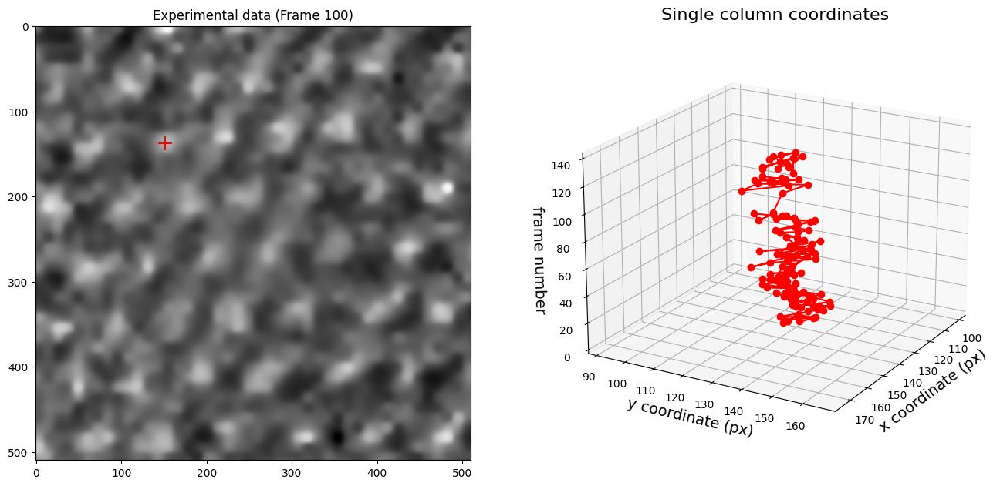

In [44]:
# Choose index of atom that you would like to track through time

ck =    7
deltalims = 40

# Extraction of "atom flow"
flow = np.empty((0,3))
c0 = coord_dict[0][ck,:2]
for k, c in coord_dict.items():
    d, index = spatial.cKDTree(
        c[:,:2]).query(c0, distance_upper_bound=2*nnd_aver)
    if d < 0.4*nnd_aver:
        flow = np.append(flow, [c[index][:3]], axis=0)
        c0 = c[index][:2]
print(flow.shape)

# Plotting results
f = 100
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(121)
ax1.imshow(img_data[f,:,:], cmap='gray')
ax1.scatter(flow[f, 1], flow[f, 0], c='red', marker='+', s=160)
ax1.set_title('Experimental data (Frame ' + str(f) +')')

ax2 = fig.add_subplot(122, projection = '3d')
ax2.view_init(20, 30)
ax2.set_xlabel('x coordinate (px)', fontsize=14)
ax2.set_ylabel('y coordinate (px)', fontsize=14)
ax2.set_zlabel('frame number', fontsize=14)
ax2.set_title('Single column coordinates', fontsize=16)
ax2.plot(flow[:,1], flow[:,0], np.arange(flow.shape[0]), '-o', c='red')
ax2.set_xlim(c0[1]-deltalims, c0[1]+deltalims)
ax2.set_ylim(c0[0]-deltalims, c0[0]+deltalims)
ax2.set_zlim(0,len(coord_dict))